## **`BUSINESS CONTEXT`**

Renewable energy sources play an increasingly important role in the global energy mix, as the effort to
reduce the environmental impact of energy production increases.
Out of all the renewable energy alternatives, wind energy is one of the most developed technologies
worldwide. The U.S. Department of Energy has put together a guide to achieving operational efficiency
using predictive maintenance practices.

Predictive maintenance uses sensor information and analysis methods to measure and predict
degradation and future component capability. The idea behind predictive maintenance is that failure
patterns are predictable and if component failure can be predicted accurately and the component is
replaced before it fails, the costs of operation and maintenance will be much lower.

The sensors fitted across different machines involved in the process of energy generation collect data
related to various environmental factors (temperature, humidity, wind speed, etc.) and additional
features related to various parts of the wind turbine (gearbox, tower, blades, break, etc.).

### **OBJECTIVE**

"ReneWind" is a company working on improving the machinery/processes involved in the production of
wind energy using machine learning and has collected data on generator failure of wind turbines using
sensors. They have shared a ciphered version of the data, as the data collected through sensors is
confidential (the type of data collected varies with companies). Data has 40 predictors, 20000
observations in the training set, and 5000 in the test set.

**The objective is to build various classification models, tune them, and find the best one that will help
identify failures so that the generators can be repaired before failing/breaking to reduce the overall
maintenance cost.**

The nature of predictions made by the classification model will translate as follows:
- True positives (TP) are failures correctly predicted by the model. These will result in repair costs.
- False negatives (FN) are real failures where there is no detection by the model. These will result
in replacement costs.
- False positives (FP) are detections where there is no failure. These will result in inspection costs.
It is given that the cost of repairing a generator is much less than the cost of replacing it, and the cost
of inspection is less than the cost of repair.
"1" in the target variable should be considered as "failure" and "0" represents "No failure".

### **DATA DICTIONARY**
The data provided is a transformed version of the original data which was collected using sensors.
- Train.csv - To be used for training and tuning of models.
- Test.csv - To be used only for testing the performance of the final best model.

Both datasets consist of 40 predictor variables and 1 target variable.

In [244]:
import pandas as pd  # Library for data manipulation and analysis.
import numpy as np   # Fundamental package for scientific computing.
import matplotlib.pyplot as plt  # Plotting library for creating visualizations.
%matplotlib inline
import seaborn as sns #For advanced visualizations.
from sklearn.metrics import confusion_matrix

from sklearn.model_selection import train_test_split  # Function for splitting datasets for training and testing.
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import recall_score, accuracy_score, precision_score, f1_score

import time  # Module for time-related operations.

import tensorflow as tf #An end-to-end open source machine learning platform
from tensorflow import keras  # High-level neural networks API for deep learning.
from keras import backend   # Abstraction layer for neural network backend engines.
from keras.models import Sequential  # Model for building NN sequentially.
from keras.layers import Dense,Dropout,BatchNormalization   # for creating fully connected neural network layers.
from keras.optimizers import SGD, Adam  # Optimizer for training deep learning models.
from tensorflow.keras.initializers import GlorotNormal, GlorotUniform, he_normal, he_uniform
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.metrics import Recall
from tensorflow.keras.models import save_model

# To undersample and oversample the data
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

# Suppress warnings for cleaner output
import warnings
warnings.filterwarnings("ignore")    # To ignore unnecessary warnings during execution

In [2]:
# Set the seed using keras.utils.set_random_seed. This will set:
# 1) `numpy` seed
# 2) backend random seed
# 3) `python` random seed
keras.utils.set_random_seed(812)

# If using TensorFlow, this will make GPU ops as deterministic as possible,
# but it might affect the overall performance
tf.config.experimental.enable_op_determinism()

----
## **READING DATASET**
----

In [ ]:
# reading datasets
train_df = pd.read_csv('Train.csv')
test_df = pd.read_csv('Test.csv')

In [4]:
train_df

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V32,V33,V34,V35,V36,V37,V38,V39,V40,Target
0,-4.464606,-4.679129,3.101546,0.506130,-0.221083,-2.032511,-2.910870,0.050714,-1.522351,3.761892,...,3.059700,-1.690440,2.846296,2.235198,6.667486,0.443809,-2.369169,2.950578,-3.480324,0
1,3.365912,3.653381,0.909671,-1.367528,0.332016,2.358938,0.732600,-4.332135,0.565695,-0.101080,...,-1.795474,3.032780,-2.467514,1.894599,-2.297780,-1.731048,5.908837,-0.386345,0.616242,0
2,-3.831843,-5.824444,0.634031,-2.418815,-1.773827,1.016824,-2.098941,-3.173204,-2.081860,5.392621,...,-0.257101,0.803550,4.086219,2.292138,5.360850,0.351993,2.940021,3.839160,-4.309402,0
3,1.618098,1.888342,7.046143,-1.147285,0.083080,-1.529780,0.207309,-2.493629,0.344926,2.118578,...,-3.584425,-2.577474,1.363769,0.622714,5.550100,-1.526796,0.138853,3.101430,-1.277378,0
4,-0.111440,3.872488,-3.758361,-2.982897,3.792714,0.544960,0.205433,4.848994,-1.854920,-6.220023,...,8.265896,6.629213,-10.068689,1.222987,-3.229763,1.686909,-2.163896,-3.644622,6.510338,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,-2.071318,-1.088279,-0.796174,-3.011720,-2.287540,2.807310,0.481428,0.105171,-0.586599,-2.899398,...,-8.273996,5.745013,0.589014,-0.649988,-3.043174,2.216461,0.608723,0.178193,2.927755,1
19996,2.890264,2.483069,5.643919,0.937053,-1.380870,0.412051,-1.593386,-5.762498,2.150096,0.272302,...,-4.159092,1.181466,-0.742412,5.368979,-0.693028,-1.668971,3.659954,0.819863,-1.987265,0
19997,-3.896979,-3.942407,-0.351364,-2.417462,1.107546,-1.527623,-3.519882,2.054792,-0.233996,-0.357687,...,7.112162,1.476080,-3.953710,1.855555,5.029209,2.082588,-6.409304,1.477138,-0.874148,0
19998,-3.187322,-10.051662,5.695955,-4.370053,-5.354758,-1.873044,-3.947210,0.679420,-2.389254,5.456756,...,0.402812,3.163661,3.752095,8.529894,8.450626,0.203958,-7.129918,4.249394,-6.112267,0


In [ ]:
# information about the dataset
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 41 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   V1      19982 non-null  float64
 1   V2      19982 non-null  float64
 2   V3      20000 non-null  float64
 3   V4      20000 non-null  float64
 4   V5      20000 non-null  float64
 5   V6      20000 non-null  float64
 6   V7      20000 non-null  float64
 7   V8      20000 non-null  float64
 8   V9      20000 non-null  float64
 9   V10     20000 non-null  float64
 10  V11     20000 non-null  float64
 11  V12     20000 non-null  float64
 12  V13     20000 non-null  float64
 13  V14     20000 non-null  float64
 14  V15     20000 non-null  float64
 15  V16     20000 non-null  float64
 16  V17     20000 non-null  float64
 17  V18     20000 non-null  float64
 18  V19     20000 non-null  float64
 19  V20     20000 non-null  float64
 20  V21     20000 non-null  float64
 21  V22     20000 non-null  float64
 22

In [ ]:
test_df

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V32,V33,V34,V35,V36,V37,V38,V39,V40,Target
0,-0.613489,-3.819640,2.202302,1.300420,-1.184929,-4.495964,-1.835817,4.722989,1.206140,-0.341909,...,2.291204,-5.411388,0.870073,0.574479,4.157191,1.428093,-10.511342,0.454664,-1.448363,0
1,0.389608,-0.512341,0.527053,-2.576776,-1.016766,2.235112,-0.441301,-4.405744,-0.332869,1.966794,...,-2.474936,2.493582,0.315165,2.059288,0.683859,-0.485452,5.128350,1.720744,-1.488235,0
2,-0.874861,-0.640632,4.084202,-1.590454,0.525855,-1.957592,-0.695367,1.347309,-1.732348,0.466500,...,-1.318888,-2.997464,0.459664,0.619774,5.631504,1.323512,-1.752154,1.808302,1.675748,0
3,0.238384,1.458607,4.014528,2.534478,1.196987,-3.117330,-0.924035,0.269493,1.322436,0.702345,...,3.517918,-3.074085,-0.284220,0.954576,3.029331,-1.367198,-3.412140,0.906000,-2.450889,0
4,5.828225,2.768260,-1.234530,2.809264,-1.641648,-1.406698,0.568643,0.965043,1.918379,-2.774855,...,1.773841,-1.501573,-2.226702,4.776830,-6.559698,-0.805551,-0.276007,-3.858207,-0.537694,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-5.120451,1.634804,1.251259,4.035944,3.291204,-2.932230,-1.328662,1.754066,-2.984586,1.248633,...,9.979118,0.063438,0.217281,3.036388,2.109323,-0.557433,1.938718,0.512674,-2.694194,0
4996,-5.172498,1.171653,1.579105,1.219922,2.529627,-0.668648,-2.618321,-2.000545,0.633791,-0.578938,...,4.423900,2.603811,-2.152170,0.917401,2.156586,0.466963,0.470120,2.196756,-2.376515,0
4997,-1.114136,-0.403576,-1.764875,-5.879475,3.571558,3.710802,-2.482952,-0.307614,-0.921945,-2.999141,...,3.791778,7.481506,-10.061396,-0.387166,1.848509,1.818248,-1.245633,-1.260876,7.474682,0
4998,-1.703241,0.614650,6.220503,-0.104132,0.955916,-3.278706,-1.633855,-0.103936,1.388152,-1.065622,...,-4.100352,-5.949325,0.550372,-1.573640,6.823936,2.139307,-4.036164,3.436051,0.579249,0


In [ ]:
# information about the dataset
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 41 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   V1      4995 non-null   float64
 1   V2      4994 non-null   float64
 2   V3      5000 non-null   float64
 3   V4      5000 non-null   float64
 4   V5      5000 non-null   float64
 5   V6      5000 non-null   float64
 6   V7      5000 non-null   float64
 7   V8      5000 non-null   float64
 8   V9      5000 non-null   float64
 9   V10     5000 non-null   float64
 10  V11     5000 non-null   float64
 11  V12     5000 non-null   float64
 12  V13     5000 non-null   float64
 13  V14     5000 non-null   float64
 14  V15     5000 non-null   float64
 15  V16     5000 non-null   float64
 16  V17     5000 non-null   float64
 17  V18     5000 non-null   float64
 18  V19     5000 non-null   float64
 19  V20     5000 non-null   float64
 20  V21     5000 non-null   float64
 21  V22     5000 non-null   float64
 22  


$$
\boxed{
\begin{aligned}
&\text{1. The training dataset consists of 20,000 observations, each containing 41 columns, including 40 predictor variables (float64) and 1 target variable (int64).} \\
&\text{2. The test dataset comprises 5,000 observations, maintaining the same structure of 41 columns (float64).} \\
&\text{3. In the training set, variables V1 and V2 each have 18 missing values, while in the test set, V1 has 5 missing values and V2 has 6.} \\
\end{aligned}
}
$$

In [ ]:
# describe the dataset
train_df.describe()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V32,V33,V34,V35,V36,V37,V38,V39,V40,Target
count,19982.000000,19982.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,...,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000
mean,-0.271996,0.440430,2.484699,-0.083152,-0.053752,-0.995443,-0.879325,-0.548195,-0.016808,-0.012998,...,0.303799,0.049825,-0.462702,2.229620,1.514809,0.011316,-0.344025,0.890653,-0.875630,0.055500
std,3.441625,3.150784,3.388963,3.431595,2.104801,2.040970,1.761626,3.295756,2.160568,2.193201,...,5.500400,3.575285,3.183841,2.937102,3.800860,1.788165,3.948147,1.753054,3.012155,0.228959
min,-11.876451,-12.319951,-10.708139,-15.082052,-8.603361,-10.227147,-7.949681,-15.657561,-8.596313,-9.853957,...,-19.876502,-16.898353,-17.985094,-15.349803,-14.833178,-5.478350,-17.375002,-6.438880,-11.023935,0.000000
25%,-2.737146,-1.640674,0.206860,-2.347660,-1.535607,-2.347238,-2.030926,-2.642665,-1.494973,-1.411212,...,-3.420469,-2.242857,-2.136984,0.336191,-0.943809,-1.255819,-2.987638,-0.272250,-2.940193,0.000000
50%,-0.747917,0.471536,2.255786,-0.135241,-0.101952,-1.000515,-0.917179,-0.389085,-0.067597,0.100973,...,0.052073,-0.066249,-0.255008,2.098633,1.566526,-0.128435,-0.316849,0.919261,-0.920806,0.000000
75%,1.840112,2.543967,4.566165,2.130615,1.340480,0.380330,0.223695,1.722965,1.409203,1.477045,...,3.761722,2.255134,1.436935,4.064358,3.983939,1.175533,2.279399,2.057540,1.119897,0.000000
max,15.493002,13.089269,17.090919,13.236381,8.133797,6.975847,8.006091,11.679495,8.137580,8.108472,...,23.633187,16.692486,14.358213,15.291065,19.329576,7.467006,15.289923,7.759877,10.654265,1.000000


In [ ]:
# describe the dataset
test_df.describe()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V32,V33,V34,V35,V36,V37,V38,V39,V40,Target
count,4995.000000,4994.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,...,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,-0.277622,0.397928,2.551787,-0.048943,-0.080120,-1.042138,-0.907922,-0.574592,0.030121,0.018524,...,0.232567,-0.080115,-0.392663,2.211205,1.594845,0.022931,-0.405659,0.938800,-0.932406,0.056400
std,3.466280,3.139562,3.326607,3.413937,2.110870,2.005444,1.769017,3.331911,2.174139,2.145437,...,5.585628,3.538624,3.166101,2.948426,3.774970,1.785320,3.968936,1.716502,2.978193,0.230716
min,-12.381696,-10.716179,-9.237940,-14.682446,-7.711569,-8.924196,-8.124230,-12.252731,-6.785495,-8.170956,...,-17.244168,-14.903781,-14.699725,-12.260591,-12.735567,-5.079070,-15.334533,-5.451050,-10.076234,0.000000
25%,-2.743691,-1.649211,0.314931,-2.292694,-1.615238,-2.368853,-2.054259,-2.642088,-1.455712,-1.353320,...,-3.556267,-2.348121,-2.009604,0.321818,-0.866066,-1.240526,-2.984480,-0.208024,-2.986587,0.000000
50%,-0.764767,0.427369,2.260428,-0.145753,-0.131890,-1.048571,-0.939695,-0.357943,-0.079891,0.166292,...,-0.076694,-0.159713,-0.171745,2.111750,1.702964,-0.110415,-0.381162,0.959152,-1.002764,0.000000
75%,1.831313,2.444486,4.587000,2.166468,1.341197,0.307555,0.212228,1.712896,1.449548,1.511248,...,3.751857,2.099160,1.465402,4.031639,4.104409,1.237522,2.287998,2.130769,1.079738,0.000000
max,13.504352,14.079073,15.314503,12.140157,7.672835,5.067685,7.616182,10.414722,8.850720,6.598728,...,26.539391,13.323517,12.146302,13.489237,17.116122,6.809938,13.064950,7.182237,8.698460,1.000000


-----
## 📊 **Univariate Analysis** 
-----

In [11]:
def univariate_analysis(data,col,cat=False, legend=False):
    sns.set_palette(['darkturquoise'])
    fig, ax = plt.subplots(1, 2, figsize = (10,3));

    sns.histplot(data = data, x = col, ax = ax[0], kde=True)
    ax[0].set_title(f'{col} Distribution (Histogram)');
    ax[0].axvline(data[col].mean(), c = 'r', linestyle='--', linewidth=2, label=f'Mean: {data[col].mean():.2f}')
    ax[0].axvline(data[col].median(), c = 'y', linestyle='-', linewidth=2, label=f'Median: {data[col].median():.2f}')
    ax[0].legend(loc='upper right')

    sns.boxplot(data = data, x = col, ax = ax[1])
    ax[1].set_title(f'{col} Distribution (Boxplot)')
    plt.show()

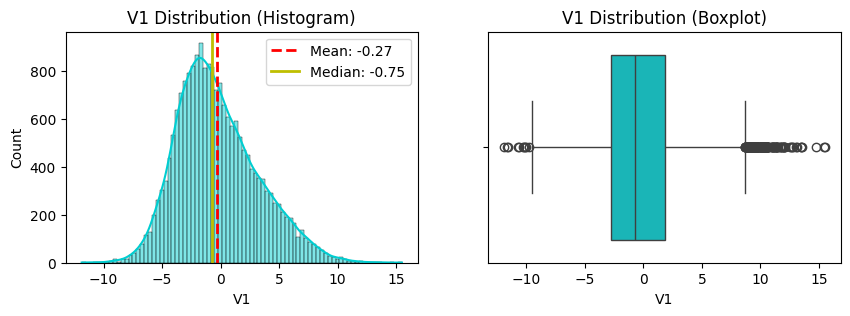

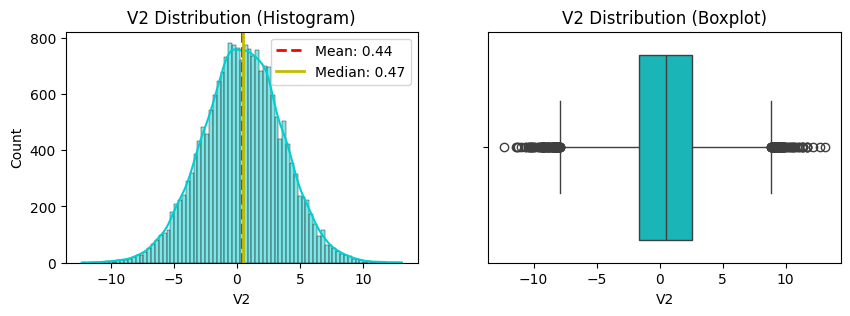

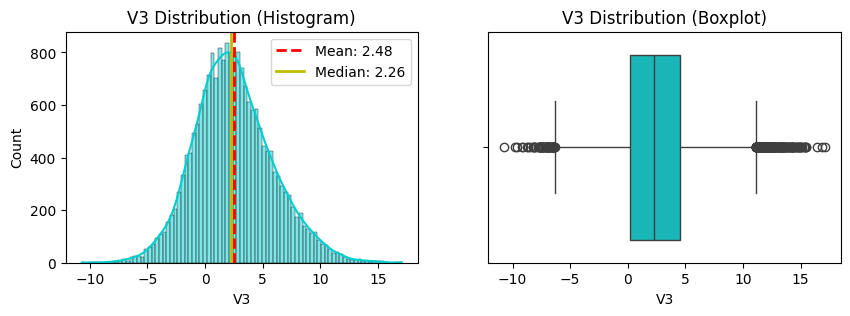

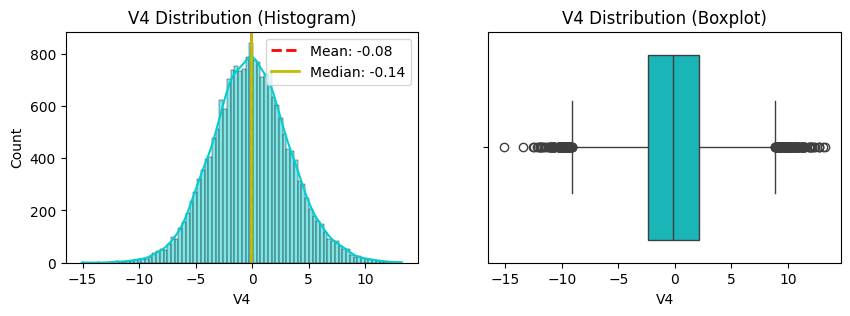

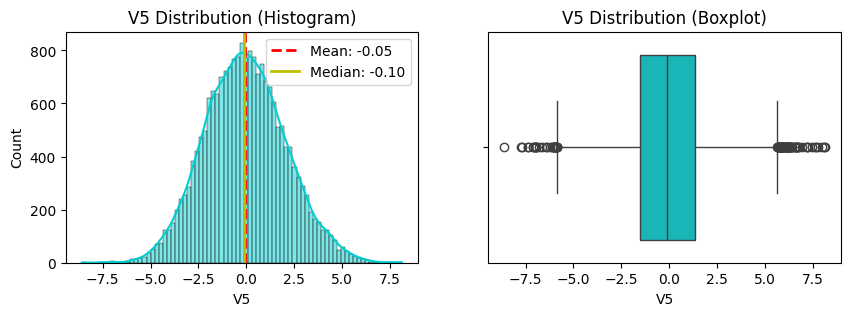

...

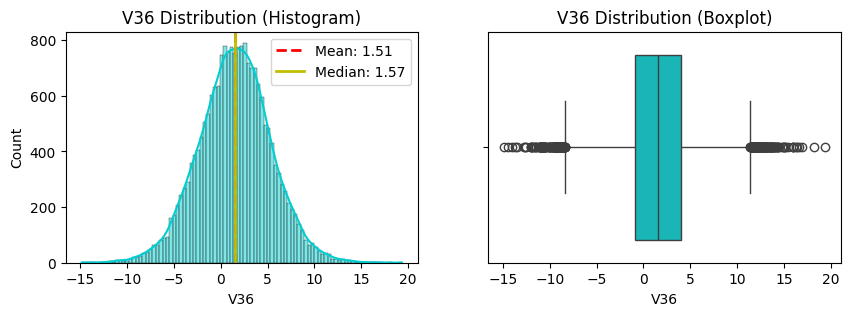

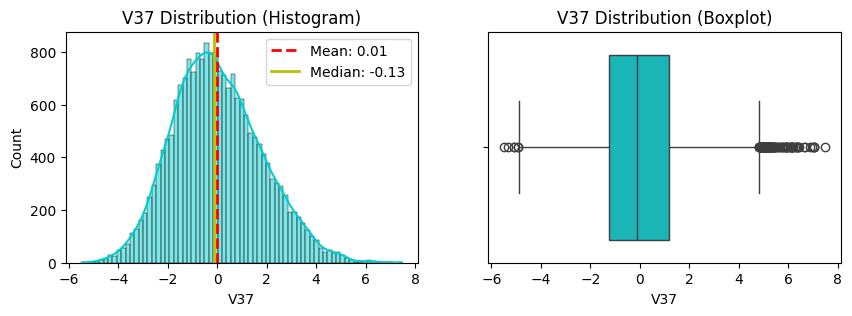

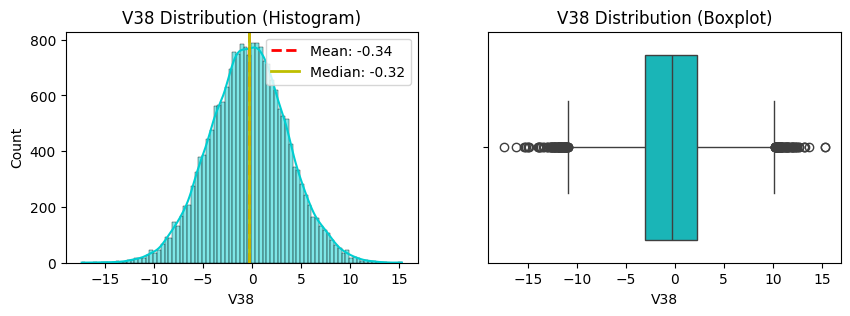

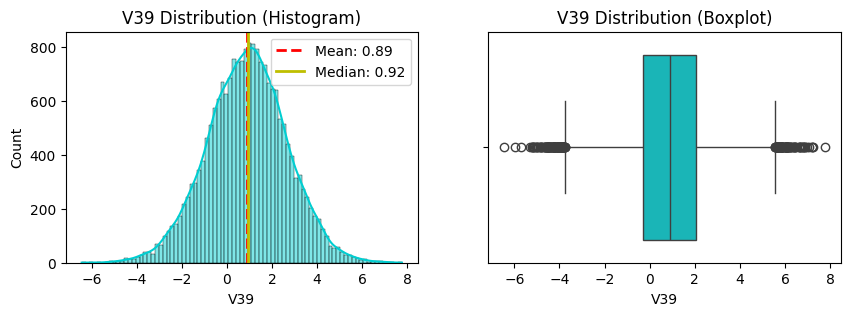

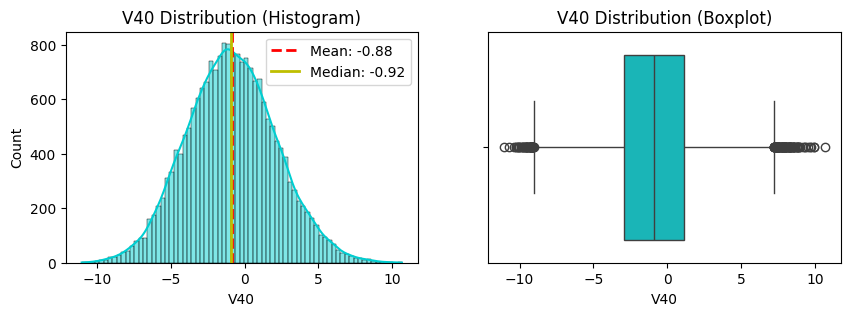

In [13]:
for col in train_df.columns[:-1]:
    univariate_analysis(train_df,col)

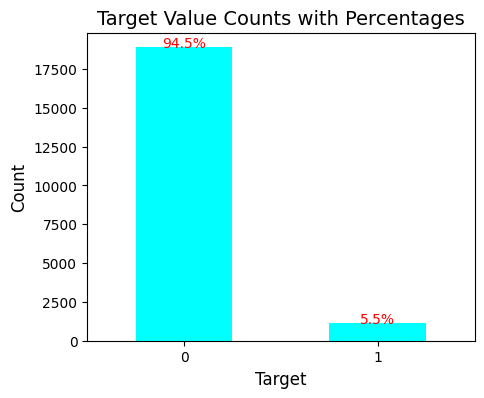

In [36]:
ax = train_df.Target.value_counts().plot(kind='bar', color='cyan', figsize=(5,4))
for i, count in enumerate(train_df.Target.value_counts()):
    ax.text(i, count + 0.1, f'{(count / train_df.Target.value_counts().sum()) * 100:.1f}%', ha='center', fontsize=10, color='red')

plt.title('Target Value Counts with Percentages', fontsize=14)
plt.xlabel('Target', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=0); 

$$
\boxed{
\begin{aligned}
&\text{1. All independent variables exhibit outliers, but their mean values are approximately equal to or close to the median.} \\
&\text{2. This pattern suggests that the variables follow a normal distribution.} \\
&\text{3. The target variable displays an imbalanced distribution, with 94.5\% of the data belonging to class (0) and only 5.5\% to class (1).} \\
\end{aligned}
}
$$

-----
## 🔗 **Bivariate Analysis** 
-----

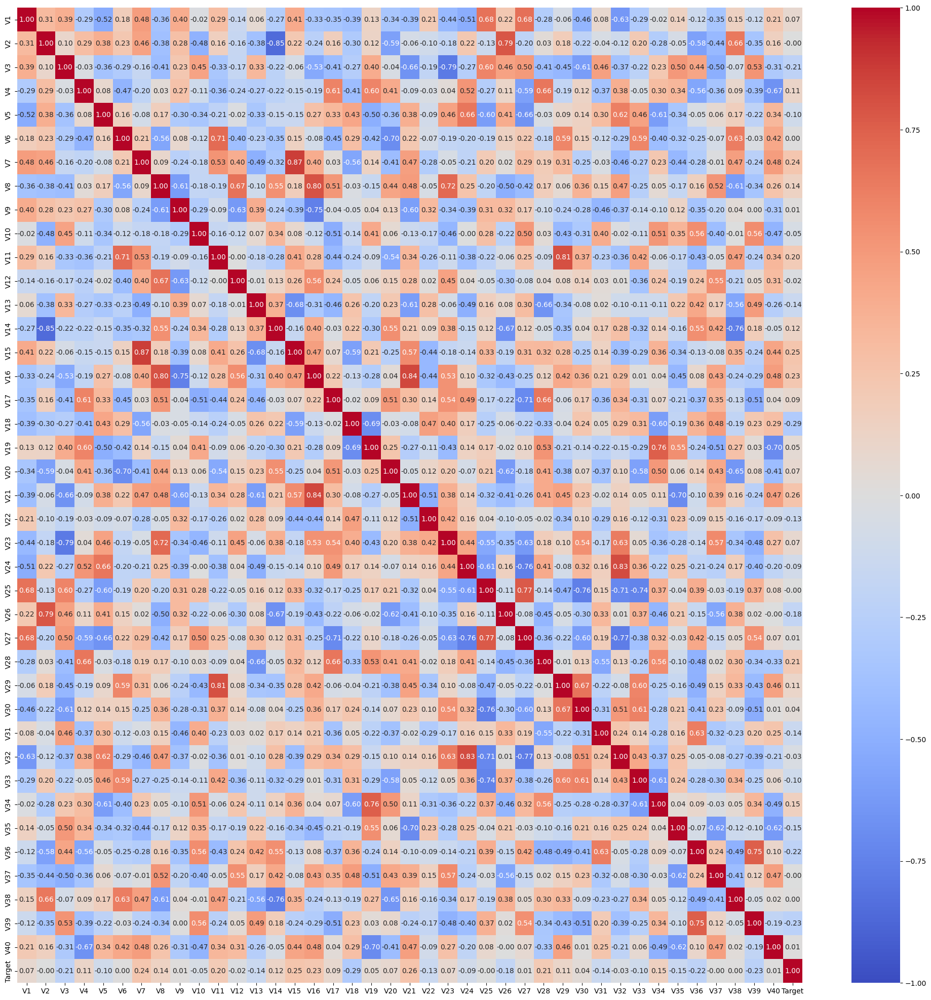

In [42]:
plt.figure(figsize=(25,25))
sns.heatmap(train_df.corr(), cmap='coolwarm', annot=True, vmin=-1, vmax=1, fmt='.2f');

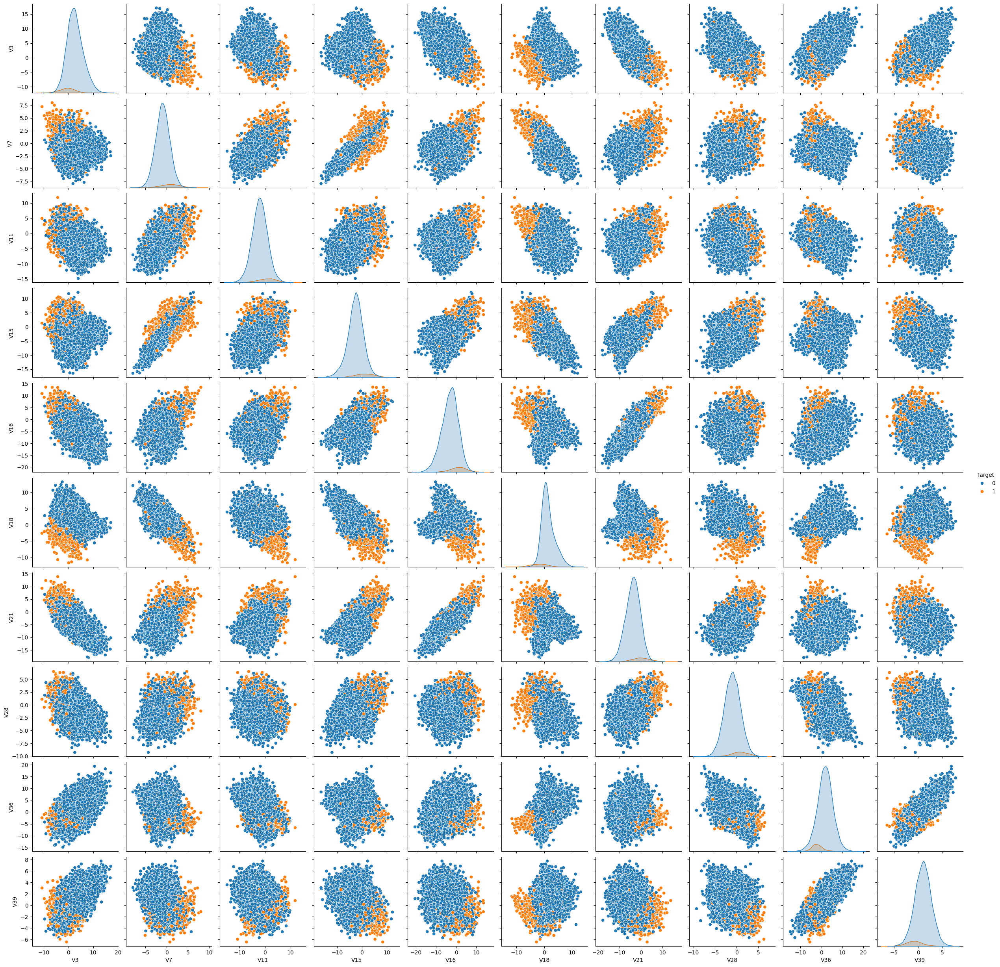

In [318]:
col_list = ["V3", "V7", "V11", "V15", "V16", "V18", "V21", "V28", "V36", "V39", "Target"]
sns.pairplot(train_df[col_list], hue='Target', diag_kind='kde')

$$
\boxed{
\begin{aligned}
&\text{1. The features "V3", "V7", "V11", "V15", "V16", "V18", "V21", "V28", "V36", and "V39" exhibit notable correlations with the target variable.} \\
&\text{2. These features show either positive or negative correlations, with absolute correlation values exceeding 0.20.} \\
&\text{3. Such strong correlations suggest that these features carry significant predictive power for the target variable.} \\
\end{aligned}
}
$$

----
## 🌟 **Data Pre-Processing** 🌟  
-------------

✂️ **Split Data into Train and Validaton Sets**  
✔️ Split the data into training and validation sets using:  
   - `train_test_split` (e.g., 80% training, 20% validation).  

In [10]:
# Splitting training data into X and y 
X, y = train_df.drop(["Target"], axis=1), train_df["Target"]

# Splitting testing data into X_test and y_test 
X_test, y_test = test_df.drop(["Target"], axis=1), test_df["Target"] 

In [11]:
# Splitting train dataset into training and validation set
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

🔎 **Handle Missing Values (if any)**  
✔️ Identify missing values and decide on an appropriate strategy.

In [12]:
# Initialize the imputer
imputer = SimpleImputer(strategy="median")

# Fit and transform the training data
X_train = imputer.fit_transform(X_train)

# Transform the validation and test datasets using the same imputer
X_val = imputer.transform(X_val)
X_test = imputer.transform(X_test)

📏 **Scale Numerical Variables (if needed)**  
✔️ Scale numerical features to bring them to a similar range.  

In [13]:
# Initialize the scaler
scaler = MinMaxScaler()

# Fit the scaler on the training data and transform it
X_train_scaled = scaler.fit_transform(X_train)

# Transform the validation and test datasets using the same scaler
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

----
## 🌟 **MODEL BUILDING** 🌟 
----

### **UTILITY FUNCTIONS**

In [14]:
def plot(history, name):
    """
    Function to plot loss/accuracy

    history: an object which stores the metrics and losses.
    name: can be one of Loss or Accuracy
    """
    fig, ax = plt.subplots() #Creating a subplot with figure and axes.
    plt.plot(history.history[name]) #Plotting the train accuracy or train loss
    plt.plot(history.history['val_'+name]) #Plotting the validation accuracy or validation loss

    plt.title('Model ' + name.capitalize()) #Defining the title of the plot.
    plt.ylabel(name.capitalize()) #Capitalizing the first letter.
    plt.xlabel('Epoch') #Defining the label for the x-axis.
    fig.legend(['Train', 'Validation'], loc="outside right upper") #Defining the legend, loc controls the position of the legend.

------
### 🎯 <u> **MODEL EVALUATION METRIC** </u>

#### ✅ **Project Objective**  
Predict generator failures (`1` in the target variable) to enable **proactive repairs**.

#### 💸 **Cost Implications**

| Outcome              | Impact                       | Cost Level         |
|----------------------|------------------------------|--------------------|
| ✅ **True Positives (TP)**  | Correct failure prediction → Repair | 🔹 Low              |
| ❌ **False Negatives (FN)** | Missed failure → Replacement        | 🔴 **Very High**     |
| ⚠️ **False Positives (FP)** | False alarm → Inspection           | 🟡 Relatively Low   |

<br>

> 🔍 **Goal**: Minimize **False Negatives (FN)**  
> ✅ **Strategy**: **Maximize Recall**

#### 📐 **Recall Formula**

$$
\text{Recall} = \frac{\text{True Positives (TP)}}{\text{True Positives (TP)} + \text{False Negatives (FN)}}
$$

Maximizing **recall** helps capture as many **true failures** as possible, **reducing replacement risks**.

#### ❌ **Why Not Other Metrics?**

🚫 **Accuracy**
- Misleading in imbalanced datasets.
- Example: Predicting all as "no failure" gives **90% accuracy** but **0% recall**.
- Fails to capture **cost of false negatives**.

🚫 **Precision**
- Focuses on minimizing false positives.
- In your case, **false negatives are more expensive**.
- Precision-only models may **miss failures** to avoid false alarms.

🚫 **F1-Score**
- Balances precision and recall:
  
$$
\text{F1} = 2 \cdot \frac{\text{Precision} \cdot \text{Recall}}{\text{Precision} + \text{Recall}}
$$

- But doesn't **prioritize recall enough** for your use case.
- May **under-optimize** recall in favor of precision.

----

We'll create a dataframe to store the results from all the models we build

In [15]:
# Defining the columns of the dataframe which are nothing but the hyper parameters and the metrics.
columns = ["# hidden layers","# neurons - hidden layer","activation function - hidden layer ","# epochs","batch size","optimizer","learning rate, momentum","weight initializer","regularization","train loss","validation loss","train recall","validation recall","time (secs)"]

# Creating a pandas dataframe.
results = pd.DataFrame(columns=columns)
results

,# hidden layers,# neurons - hidden layer,activation function - hidden layer,# epochs,batch size,optimizer,"learning rate, momentum",weight initializer,regularization,train loss,validation loss,train recall,validation recall,time (secs)


We'll be using the same batch size and epochs throughout, so let's define two variables for the same

In [16]:
batch_size = 32
epochs = 50

### 🚀 **Model 1**

In [17]:
# clears the current Keras session, resetting all layers and models previously created, freeing up memory and resources.
tf.keras.backend.clear_session()

In [18]:
model_1 = Sequential([
    Dense(16, activation='relu', input_shape=(X_train.shape[1],)),  # Hidden layer with 16 neurons
    Dense(1, activation='sigmoid')  # Output layer with sigmoid activation for binary classification
])

model_1.compile(optimizer=SGD(learning_rate=0.01), 
                loss='binary_crossentropy', 
                metrics=['accuracy', Recall()])  # Include accuracy and recall

In [19]:
model_1.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 16)             │           656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 673 (2.63 KB)

 Trainable params: 673 (2.63 KB)

 Non-trainable params: 0 (0.00 B)

In [20]:
start = time.time()
history1 = model_1.fit(X_train_scaled, y_train, validation_data=(X_val_scaled,y_val) , batch_size=batch_size, epochs=epochs)
end=time.time()

Epoch 1/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9335 - loss: 0.2999 - recall: 0.0049 - val_accuracy: 0.9445 - val_loss: 0.2225 - val_recall: 0.0000e+00
Epoch 2/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9456 - loss: 0.2195 - recall: 0.0000e+00 - val_accuracy: 0.9445 - val_loss: 0.2183 - val_recall: 0.0000e+00
Epoch 3/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9456 - loss: 0.2151 - recall: 0.0000e+00 - val_accuracy: 0.9445 - val_loss: 0.2136 - val_recall: 0.0000e+00
Epoch 4/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9456 - loss: 0.2106 - recall: 0.0000e+00 - val_accuracy: 0.9445 - val_loss: 0.2096 - val_recall: 0.0000e+00
Epoch 5/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9456 - loss: 0.2065 - recall: 0.0000e+00 - val_accuracy: 0.9445 - val_loss: 0.2056 - val_recall: 0.0000e+00
Epoch 6/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9456 - loss: 0.2025 - recall: 0.0000e+00 - val_accuracy: 0.9445 - va

In [21]:
print("Time taken in seconds ",end-start)

Time taken in seconds  68.24697852134705


In [22]:
print(history1.history.keys())

dict_keys(['accuracy', 'loss', 'recall', 'val_accuracy', 'val_loss', 'val_recall'])


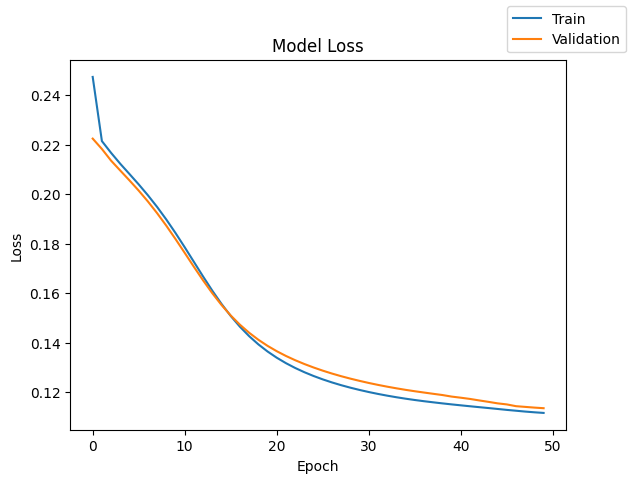

In [23]:
plot(history1,'loss')

$$
\boxed{
\begin{aligned}
&\text{1. Epoch 1 to 2: There is a sharp decline in both training loss, indicating rapid progress in model
optimization during the initial phase.  } \\
&\text{2. Post 10th Epoch: The validation loss consistently remains slightly higher than the training loss, 
showing a slight divergence between the two curves. } \\
&\text{3. Later Epochs: The rate of decrease in loss slows down progressively, with both training and 
validation loss reducing at a more gradual pace as the model converges.}
\end{aligned}
}
$$

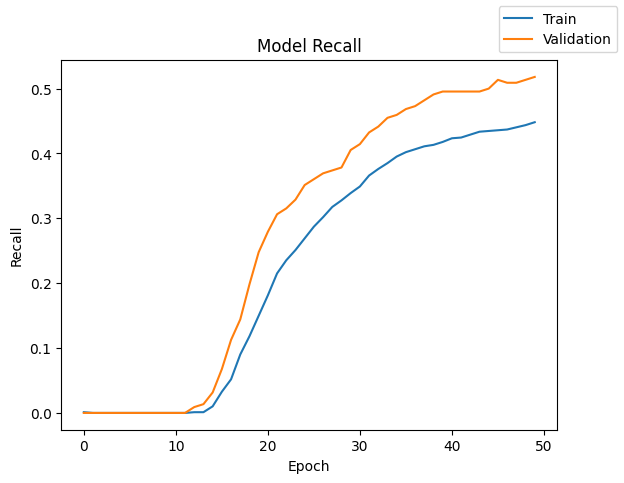

In [24]:
plot(history1,'recall')

$$
\boxed{
\begin{aligned}
&\text{1. Both training and validation recall start near zero and increase slowly after first 10 epochs.} \\
&\text{2. From epoch 10 onward, recall improves rapidly for both training and validation sets.} \\
&\text{3. After epoch 30, recall stabilizes for both sets, with only minor improvements, indicating convergence.}
\end{aligned}
}
$$

In [25]:
results.loc[len(results)] = [
    1,  # Number of hidden layers
    16,  # Neurons in hidden layer
    "ReLU",  # Activation function
    50,  # Epochs
    32,  # Batch size
    "SGD",  # Optimizer
    [0.01, "-"],  # Learning rate, momentum
    "-",  # Weight initializer
    "-",  # Regularization
    history1.history['loss'][-1],
    history1.history['val_loss'][-1],
    history1.history['recall'][-1],  
    history1.history['val_recall'][-1], 
    round(end-start,2)
]

In [26]:
results

,# hidden layers,# neurons - hidden layer,activation function - hidden layer,# epochs,batch size,optimizer,"learning rate, momentum",weight initializer,regularization,train loss,validation loss,train recall,validation recall,time (secs)
0,1,16,ReLU,50,32,SGD,"[0.01, -]",-,-,0.111683,0.11359,0.448198,0.518018,68.25


$$
\boxed{
\begin{aligned}
&\text{1. The results are good with SGD, but in the initial few epochs, the model takes time to improve.} \\
&\text{2. One reason could be that the model is near a local minimum or plateau, leading to smaller weight updates.} \\
&\text{3. Introducing momentum can accelerate convergence by increasing the magnitude of updates and reducing oscillations.} \\
&\text{4. After epoch 30, the recall stabilizes, but a slight gap between training and validation recall suggests overfitting.}
\end{aligned}
}
$$ 

### 🚀 **Model 2 : SGD WITH MOMENTUM**

In [27]:
# clears the current Keras session, resetting all layers and models previously created, freeing up memory and resources.
tf.keras.backend.clear_session()

In [28]:
model_2 = Sequential([
    Dense(16, activation='relu', input_shape=(X_train.shape[1],)),  # Hidden layer with 16 neurons
    Dense(1, activation='sigmoid')  # Output layer with sigmoid activation for binary classification
])

model_2.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9), 
                loss='binary_crossentropy', 
                metrics=['accuracy', Recall()])  # Include accuracy and recall

In [29]:
model_2.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 16)             │           656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 673 (2.63 KB)

 Trainable params: 673 (2.63 KB)

 Non-trainable params: 0 (0.00 B)

In [30]:
start = time.time()
history2 = model_2.fit(X_train_scaled, y_train, validation_data=(X_val_scaled,y_val) , batch_size=batch_size, epochs=epochs)
end=time.time()

Epoch 1/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9456 - loss: 0.2160 - recall: 0.0000e+00 - val_accuracy: 0.9445 - val_loss: 0.1731 - val_recall: 0.0000e+00
Epoch 2/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9468 - loss: 0.1538 - recall: 0.0224 - val_accuracy: 0.9575 - val_loss: 0.1369 - val_recall: 0.2748
Epoch 3/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9585 - loss: 0.1289 - recall: 0.2592 - val_accuracy: 0.9615 - val_loss: 0.1229 - val_recall: 0.4009
Epoch 4/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9637 - loss: 0.1201 - recall: 0.3763 - val_accuracy: 0.9647 - val_loss: 0.1172 - val_recall: 0.4685
Epoch 5/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9653 - loss: 0.1168 - recall: 0.4150 - val_accuracy: 0.9645 - val_loss: 0.1147 - val_recall: 0.4775
Epoch 6/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9648 - loss: 0.1154 - recall: 0.4260 - val_accuracy: 0.9660 - val_loss: 0.1135 - val_recall: 0.4

In [31]:
print("Time taken in seconds ",end-start)

Time taken in seconds  58.95955753326416


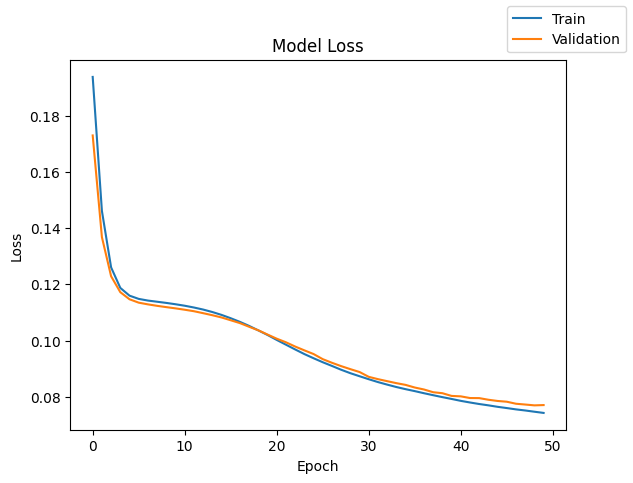

In [32]:
plot(history2,'loss')

$$
\boxed{
\begin{aligned}
&\text{1. Initial rapid decrease in loss indicates quick learning.} \\
&\text{2. Steady convergence shows gradual improvement.} \\
&\text{3. Validation loss remains close to training loss, indicating good generalization.} \\
&\text{4. Low final loss values suggest effective training.}
\end{aligned}
}
$$

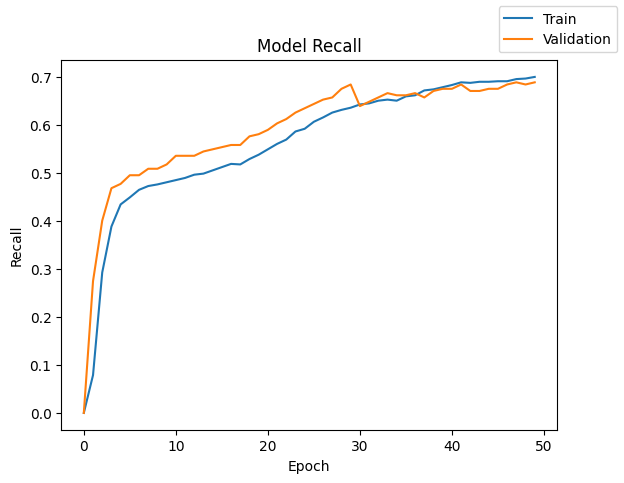

In [33]:
plot(history2,'recall')

$$
\boxed{
\begin{aligned}
&\text{1. Initial rapid increase in recall indicates effective learning.} \\
&\text{2. Stabilization at high recall values indicates good performance.} \\
&\text{3. Final phase (epochs 30-50) where learning slows and appears to approach convergence at ~0.73. The converging lines suggest the model is reaching its capacity with this architecture}
\end{aligned}
}
$$

In [34]:
results.loc[len(results)] = [
    1,  # Number of hidden layers
    16,  # Neurons in hidden layer
    "ReLU",  # Activation function
    50,  # Epochs
    32,  # Batch size
    "SGD",  # Optimizer
    [0.01, 0.9],  # Learning rate, momentum
    "-",  # Weight initializer
    "-",  # Regularization
    history2.history['loss'][-1],
    history2.history['val_loss'][-1],
    history2.history['recall'][-1],  
    history2.history['val_recall'][-1], 
    round(end-start,2)
]

In [35]:
results

,# hidden layers,# neurons - hidden layer,activation function - hidden layer,# epochs,batch size,optimizer,"learning rate, momentum",weight initializer,regularization,train loss,validation loss,train recall,validation recall,time (secs)
0,1,16,ReLU,50,32,SGD,"[0.01, -]",-,-,0.111683,0.113590,0.448198,0.518018,68.25
1,1,16,ReLU,50,32,SGD,"[0.01, 0.9]",-,-,0.074216,0.077015,0.700450,0.689189,58.96


$$
\boxed{
\begin{aligned}
&\text{The addition of momentum (0.9) to the SGD optimizer has made a substantial positive impact across all performance metrics. The second model:} \\
&\text{1. Performs significantly better (higher recall, lower loss)} \\
&\text{2. Trains noticeably faster}\\
&\text{3. Shows excellent generalization with nearly identical training and validation recall}\\
&\text{}\\
&\text{While Model 2 shows dramatic improvement from momentum, its early convergence indicates untapped potential that could be unlocked with increased model complexity. }\\
\end{aligned}
}
$$

### 🚀 **Model 3: Increased Complexity**

In [36]:
# clears the current Keras session, resetting all layers and models previously created, freeing up memory and resources.
tf.keras.backend.clear_session()

In [37]:
model_3 = Sequential([
    Dense(16, activation='relu', input_shape=(X_train.shape[1],)),  # Hidden layer with 16 neurons
    Dense(8, activation='relu'),  # Second hidden layer with 8 neurons
    Dense(1, activation='sigmoid')  # Output layer with sigmoid activation for binary classification
])

model_3.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9), 
                loss='binary_crossentropy', 
                metrics=['accuracy', Recall()])  # Include accuracy and recall

In [38]:
model_3.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 16)             │           656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 8)              │           136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │             9 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 801 (3.13 KB)

 Trainable params: 801 (3.13 KB)

 Non-trainable params: 0 (0.00 B)

In [39]:
start = time.time()
history3 = model_3.fit(X_train_scaled, y_train, validation_data=(X_val_scaled,y_val) , batch_size=batch_size, epochs=epochs)
end=time.time()

Epoch 1/50


500/500 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9456 - loss: 0.2465 - recall: 0.0000e+00 - val_accuracy: 0.9445 - val_loss: 0.1978 - val_recall: 0.0000e+00
Epoch 2/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9457 - loss: 0.1713 - recall: 0.0030 - val_accuracy: 0.9560 - val_loss: 0.1308 - val_recall: 0.2297
Epoch 3/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9593 - loss: 0.1276 - recall: 0.3208 - val_accuracy: 0.9640 - val_loss: 0.1172 - val_recall: 0.4595
Epoch 4/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9639 - loss: 0.1201 - recall: 0.4301 - val_accuracy: 0.9650 - val_loss: 0.1137 - val_recall: 0.4910
Epoch 5/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9644 - loss: 0.1170 - recall: 0.4506 - val_accuracy: 0.9657 - val_loss: 0.1112 - val_recall: 0.4910
Epoch 6/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9640 - loss: 0.1149 - recall: 0.4532 - val_accuracy: 0.9655 - val_loss: 0.1094 - val_recall: 0.4865
Epoch 7

In [40]:
print("Time taken in seconds ",end-start)

Time taken in seconds  65.60693073272705


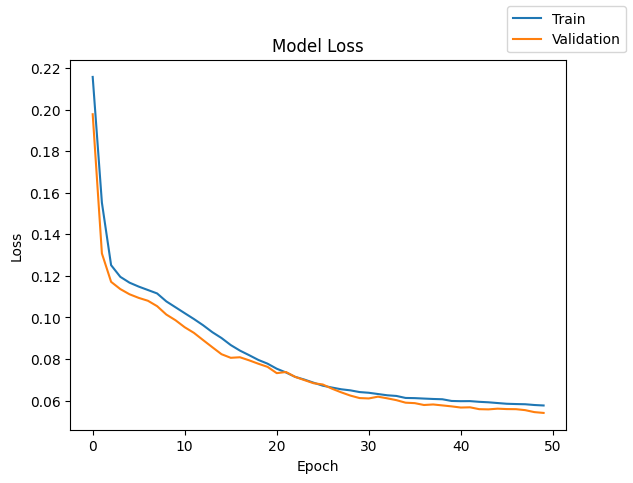

In [41]:
plot(history3,'loss')

$$
\boxed{
\begin{aligned}
&\text{1. Initial rapid decrease in loss during first 5 epochs demonstrates effective early learning.} \\
&\text{2. Moderate decrease between epochs 5-20 shows continued model improvement at declining rate.} \\
&\text{3. Validation loss closely tracks training loss throughout, with minimal gap at convergence.} \\
&\text{4. Smooth convergence pattern without divergence suggests appropriate learning rate configuration.} \\
\end{aligned}
}
$$

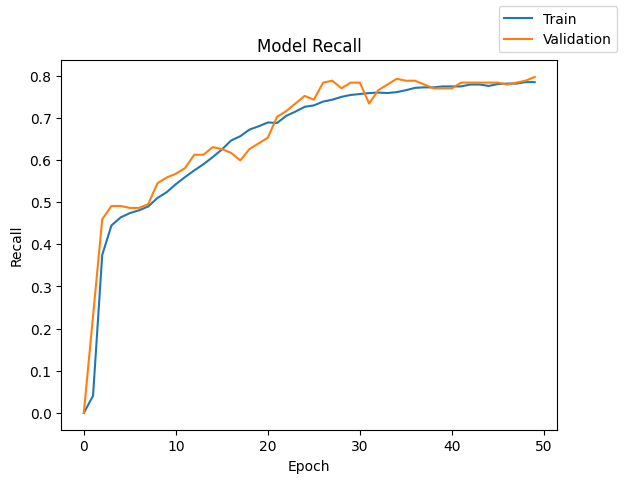

In [42]:
plot(history3,'recall')

$$
\boxed{
\begin{aligned}
&\text{1. Initial rapid increase in recall during first 5 epochs indicates highly effective early learning.} \\
&\text{2. Middle phase (epochs 5-30) shows continued improvement at a moderate pace.} \\
&\text{3. Final phase (epochs 30-50) demonstrates slower learning as model approaches its capacity limit.} \\
&\text{4. Validation recall consistently exceeds training recall throughout most of the training process.} \\
\end{aligned}
}
$$

In [43]:
results.loc[len(results)] = [
    2,  # Number of hidden layers
    [16, 8],  # Neurons in hidden layer
    ["ReLU", "ReLU"],  # Activation function
    50,  # Epochs
    32,  # Batch size
    "SGD",  # Optimizer
    [0.01, 0.9],  # Learning rate, momentum
    "-",  # Weight initializer
    "-",  # Regularization
    history3.history['loss'][-1],
    history3.history['val_loss'][-1],
    history3.history['recall'][-1],  
    history3.history['val_recall'][-1], 
    round(end-start,2)
]

In [44]:
results

,# hidden layers,# neurons - hidden layer,activation function - hidden layer,# epochs,batch size,optimizer,"learning rate, momentum",weight initializer,regularization,train loss,validation loss,train recall,validation recall,time (secs)
0,1,16,ReLU,50,32,SGD,"[0.01, -]",-,-,0.111683,0.113590,0.448198,0.518018,68.25
1,1,16,ReLU,50,32,SGD,"[0.01, 0.9]",-,-,0.074216,0.077015,0.700450,0.689189,58.96
2,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,-,0.057651,0.054069,0.784910,0.797297,65.61


$$
\boxed{
\begin{aligned}
&\text{1. Adding a second hidden layer increased validation recall slightly, but training recall decreased.} \\
&\text{2. Loss values increased marginally for both training and validation sets.} \\
&\text{3. Training time increased significantly, reflecting the added computational complexity.} \\
&\text{} \\
&\text{Conclusion: While Model 3 demonstrated marginal gains in validation recall, its higher complexity and computational cost did not yield proportional improvements, indicating that further tuning or regularization may be necessary to justify the added layer.}
\end{aligned}
}
$$

### 🚀 **Model 4 : ADDING DROPOUT LAYER**

In [45]:
# clears the current Keras session, resetting all layers and models previously created, freeing up memory and resources.
tf.keras.backend.clear_session()

In [46]:
model_4 = Sequential([
    Dense(16, activation='relu', input_shape=(X_train.shape[1],)),  # Hidden layer with 16 neurons
    Dropout(0.3),
    Dense(8, activation='relu'),  # Second hidden layer with 8 neurons
    Dropout(0.3),
    Dense(1, activation='sigmoid')  # Output layer with sigmoid activation for binary classification
])

model_4.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9), 
                loss='binary_crossentropy', 
                metrics=['accuracy', Recall()])  # Include accuracy and recall

In [47]:
model_4.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 16)             │           656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 8)              │           136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │             9 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 801 (3.13 KB)

 Trainable params: 801 (3.13 KB)

 Non-trainable params: 0 (0.00 B)

In [48]:
start = time.time()
history4 = model_4.fit(X_train_scaled, y_train, validation_data=(X_val_scaled,y_val) , batch_size=batch_size, epochs=epochs)
end=time.time()

Epoch 1/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8914 - loss: 0.3157 - recall: 0.0473 - val_accuracy: 0.9445 - val_loss: 0.2086 - val_recall: 0.0000e+00
Epoch 2/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9456 - loss: 0.2000 - recall: 1.3680e-04 - val_accuracy: 0.9445 - val_loss: 0.1635 - val_recall: 0.0000e+00
Epoch 3/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9472 - loss: 0.1681 - recall: 0.0393 - val_accuracy: 0.9473 - val_loss: 0.1385 - val_recall: 0.0495
Epoch 4/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9514 - loss: 0.1508 - recall: 0.1698 - val_accuracy: 0.9557 - val_loss: 0.1248 - val_recall: 0.2117
Epoch 5/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9537 - loss: 0.1426 - recall: 0.2408 - val_accuracy: 0.9585 - val_loss: 0.1194 - val_recall: 0.2568
Epoch 6/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9593 - loss: 0.1316 - recall: 0.3227 - val_accuracy: 0.9645 - val_loss: 0.1126 - val_recall:

In [49]:
print("Time taken in seconds ",end-start)

Time taken in seconds  62.00507831573486


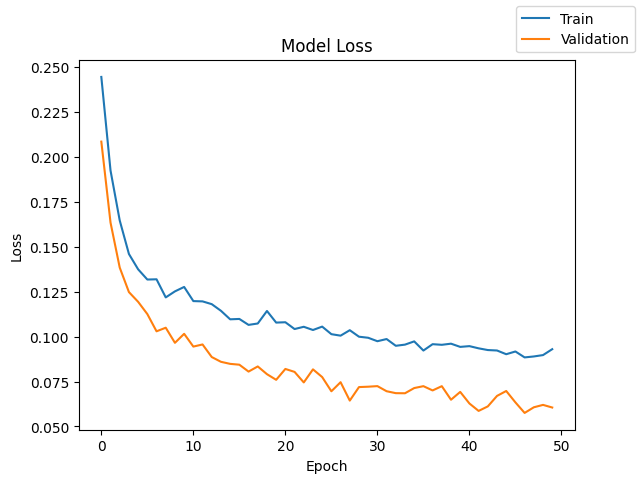

In [50]:
plot(history4,'loss')

$$
\boxed{
\begin{aligned}
&\text{1. Sharp drop in both losses early shows fast initial learning.} \\
&\text{2. Gradual decline in later epochs indicates slower improvement.} \\
&\text{3. Validation loss remains consistently lower than training loss.} \\
&\text{4. No signs of overfitting or divergence throughout training.} \\
\end{aligned}
}
$$

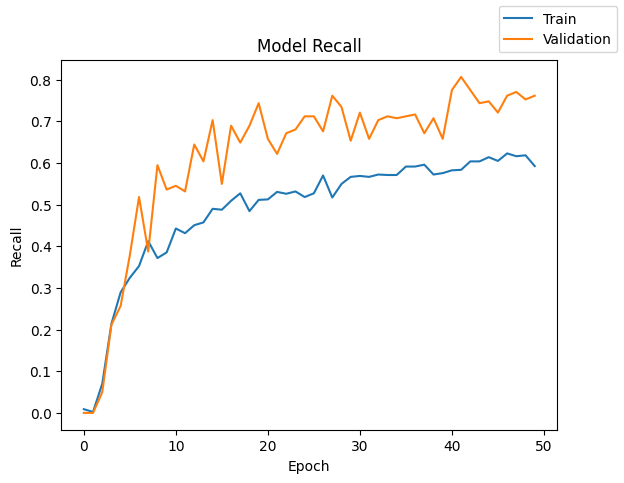

In [51]:
plot(history4,'recall')

$$
\boxed{
\begin{aligned}
&\text{1. Rapid rise in recall early shows quick gain in sensitivity.} \\
&\text{2. Validation recall is higher and more variable than training recall.} \\
&\text{3. Training recall improves steadily but flattens toward the end.} \\
&\text{4. No major drop in validation recall suggests stable generalization.} \\
\end{aligned}
}
$$

In [61]:
results.loc[len(results)] = [
    2,  # Number of hidden layers
    [16, 8],  # Neurons in hidden layer
    ["ReLU", "ReLU"],  # Activation function
    50,  # Epochs
    32,  # Batch size
    "SGD",  # Optimizer
    [0.01, 0.9],  # Learning rate, momentum
    "-",  # Weight initializer
    "Dropout (0.3)",  # Regularization
    history4.history['loss'][-1],
    history4.history['val_loss'][-1],
    history4.history['recall'][-1],  
    history4.history['val_recall'][-1], 
    round(end-start,2)
]

In [62]:
results

,# hidden layers,# neurons - hidden layer,activation function - hidden layer,# epochs,batch size,optimizer,"learning rate, momentum",weight initializer,regularization,train loss,validation loss,train recall,validation recall,time (secs)
0,1,16,ReLU,50,32,SGD,"[0.01, -]",-,-,0.111683,0.113590,0.448198,0.518018,68.25
1,1,16,ReLU,50,32,SGD,"[0.01, 0.9]",-,-,0.074216,0.077015,0.700450,0.689189,58.96
2,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,-,0.057651,0.054069,0.784910,0.797297,65.61
3,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,Dropout (0.3),0.093040,0.060558,0.592342,0.761261,62.01


$$
\boxed{
\begin{aligned}
&\text{1. Despite the added regularization, the validation recall of the current model is slightly lower than the previous model, likely due to the increased dropout rate.} \\
&\text{2. The training recall is significantly lower in the current model, indicating that Dropout (0.3) may be too aggressive for this dataset.} \\
&\text{3. Training and validation loss are higher in the current model compared to the previous model, suggesting reduced model performance.} \\
&\text{} \\
&\text{Conclusion: While Dropout helps prevent overfitting, the current model's performance is inferior to the previous model due to overly aggressive regularization.}
\end{aligned}
}
$$

### 🚀 **Model 5 : ADAM AS OPTIMIZER IN THE MODEL 3**

In [63]:
# clears the current Keras session, resetting all layers and models previously created, freeing up memory and resources.
tf.keras.backend.clear_session()

In [65]:
model_5 = Sequential([
    Dense(16, activation='relu', input_shape=(X_train.shape[1],)),  # First hidden layer with 16 neurons
    Dense(8, activation='relu'),  # Second hidden layer with 8 neurons
    Dense(1, activation='sigmoid')  # Output layer with sigmoid activation for binary classification
])

# Step 2: Compile the model with Adam optimizer
model_5.compile(optimizer=Adam(learning_rate=0.01), 
                loss='binary_crossentropy', 
                metrics=['accuracy', Recall()])  # Include accuracy and recall


In [66]:
start = time.time()
history5 = model_5.fit(X_train_scaled, y_train, validation_data=(X_val_scaled,y_val) , batch_size=batch_size, epochs=epochs)
end=time.time()

Epoch 1/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8978 - loss: 0.3003 - recall: 0.0681 - val_accuracy: 0.9605 - val_loss: 0.1260 - val_recall: 0.5901
Epoch 2/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9596 - loss: 0.1206 - recall: 0.4111 - val_accuracy: 0.9668 - val_loss: 0.1084 - val_recall: 0.5270
Epoch 3/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9645 - loss: 0.1147 - recall: 0.4820 - val_accuracy: 0.9690 - val_loss: 0.1069 - val_recall: 0.4685
Epoch 4/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9663 - loss: 0.1109 - recall: 0.4898 - val_accuracy: 0.9703 - val_loss: 0.1020 - val_recall: 0.4955
Epoch 5/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9685 - loss: 0.1072 - recall: 0.5224 - val_accuracy: 0.9707 - val_loss: 0.0995 - val_recall: 0.4865
Epoch 6/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9694 - loss: 0.1026 - recall: 0.5279 - val_accuracy: 0.9743 - val_loss: 0.0941 - val_recall: 0.5721
Epoc

In [67]:
print("Time taken in seconds ",end-start)

Time taken in seconds  61.70592212677002


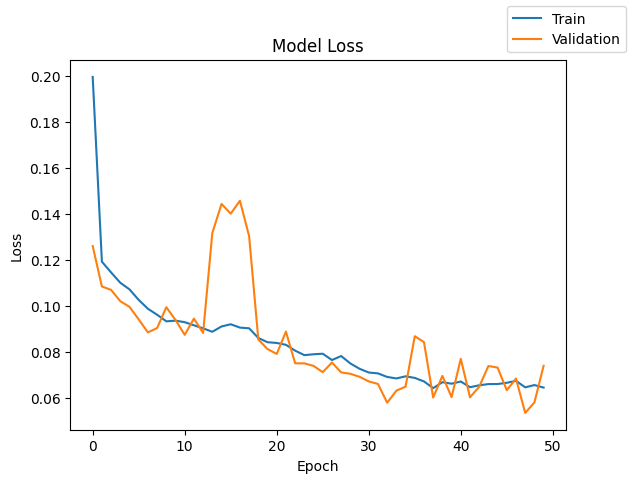

In [68]:
plot(history5,'loss')

$$
\boxed{
\begin{aligned}
&\text{1. Sharp initial decrease in training loss while validation shows early instability.} \\
&\text{2. Significant validation loss spike around epochs 12-18 indicates potential learning issues.} \\
\end{aligned}
}
$$

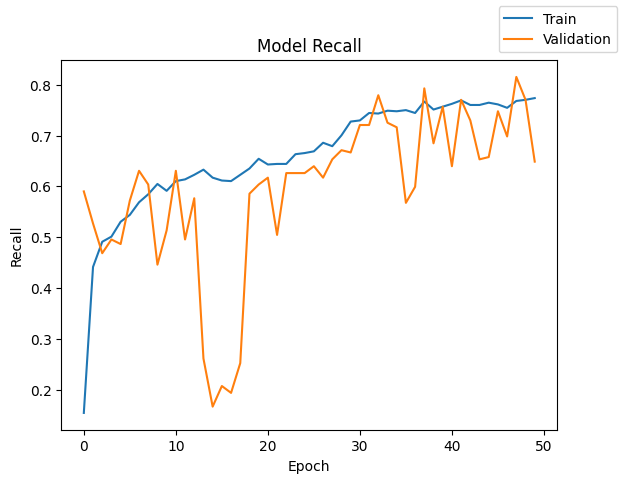

In [69]:
plot(history5,'recall')

$$
\boxed{
\begin{aligned}
&\text{1. Training recall shows steady improvement while validation recall exhibits extreme volatility.} \\
&\text{2. Severe validation recall drop around epochs 15-20 indicates potential model confusion.} \\
&\text{3. Despite fluctuations, both curves show overall upward trend from start to finish.} \\
&\text{4. Final phase shows high but unstable validation recall, suggesting inconsistent generalization.} \\
\end{aligned}
}
$$

In [70]:
results.loc[len(results)] = [
    2,  # Number of hidden layers
    [16, 8],  # Neurons in hidden layer
    ["ReLU", "ReLU"],  # Activation function
    50,  # Epochs
    32,  # Batch size
    "ADAM",  # Optimizer
    [0.01],  # Learning rate, momentum
    "-",  # Weight initializer
    "-",  # Regularization
    history5.history['loss'][-1],
    history5.history['val_loss'][-1],
    history5.history['recall'][-1],  
    history5.history['val_recall'][-1], 
    round(end-start,2)
]

In [71]:
results

,# hidden layers,# neurons - hidden layer,activation function - hidden layer,# epochs,batch size,optimizer,"learning rate, momentum",weight initializer,regularization,train loss,validation loss,train recall,validation recall,time (secs)
0,1,16,ReLU,50,32,SGD,"[0.01, -]",-,-,0.111683,0.113590,0.448198,0.518018,68.25
1,1,16,ReLU,50,32,SGD,"[0.01, 0.9]",-,-,0.074216,0.077015,0.700450,0.689189,58.96
2,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,-,0.057651,0.054069,0.784910,0.797297,65.61
3,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,Dropout (0.3),0.093040,0.060558,0.592342,0.761261,62.01
4,2,"[16, 8]","[ReLU, ReLU]",50,32,ADAM,[0.01],-,-,0.064352,0.073845,0.773649,0.648649,61.71


$$
\boxed{
\begin{aligned}
&\text{1. The current model switches the optimizer from SGD with momentum to ADAM, while keeping other parameters unchanged.} \\
&\text{2. Despite the change in optimizer, the validation recall drops significantly compared to the previous model.} \\
&\text{3. The training recall is slightly higher than the previous model, but this does not translate to better generalization.} \\
&\text{4. Both training and validation loss are higher in the current model compared to the previous model, indicating poorer performance.} \\
&\text{} \\
&\text{Conclusion: The switch to ADAM results in worse generalization and lower validation recall compared to the previous model. SGD with momentum remains a better choice for this dataset.}
\end{aligned}
}
$$

### 🚀 **Model 6 : CHECKING OUT DROPOUT OF 0.1 IN MODEL 3**

In [72]:
# clears the current Keras session, resetting all layers and models previously created, freeing up memory and resources.
tf.keras.backend.clear_session()

In [73]:
model_6 = Sequential([
    Dense(16, activation='relu', input_shape=(X_train.shape[1],)),  # Hidden layer with 16 neurons
    Dropout(0.1),
    Dense(8, activation='relu'),  # Second hidden layer with 8 neurons
    Dropout(0.1),
    Dense(1, activation='sigmoid')  # Output layer with sigmoid activation for binary classification
])

model_6.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9), 
                loss='binary_crossentropy', 
                metrics=['accuracy', Recall()])  # Include accuracy and recall

In [74]:
start = time.time()
history6 = model_6.fit(X_train_scaled, y_train, validation_data=(X_val_scaled,y_val) , batch_size=batch_size, epochs=epochs)
end=time.time()

Epoch 1/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9024 - loss: 0.3130 - recall: 0.0222 - val_accuracy: 0.9445 - val_loss: 0.1911 - val_recall: 0.0000e+00
Epoch 2/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9468 - loss: 0.1737 - recall: 0.0262 - val_accuracy: 0.9550 - val_loss: 0.1289 - val_recall: 0.1937
Epoch 3/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9549 - loss: 0.1380 - recall: 0.2498 - val_accuracy: 0.9643 - val_loss: 0.1126 - val_recall: 0.4054
Epoch 4/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9594 - loss: 0.1250 - recall: 0.3647 - val_accuracy: 0.9678 - val_loss: 0.1023 - val_recall: 0.4820
Epoch 5/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9641 - loss: 0.1170 - recall: 0.4548 - val_accuracy: 0.9700 - val_loss: 0.0999 - val_recall: 0.5495
Epoch 6/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9672 - loss: 0.1085 - recall: 0.5053 - val_accuracy: 0.9732 - val_loss: 0.0959 - val_recall: 0.6532


In [75]:
print("Time taken in seconds ",end-start)

Time taken in seconds  64.09643530845642


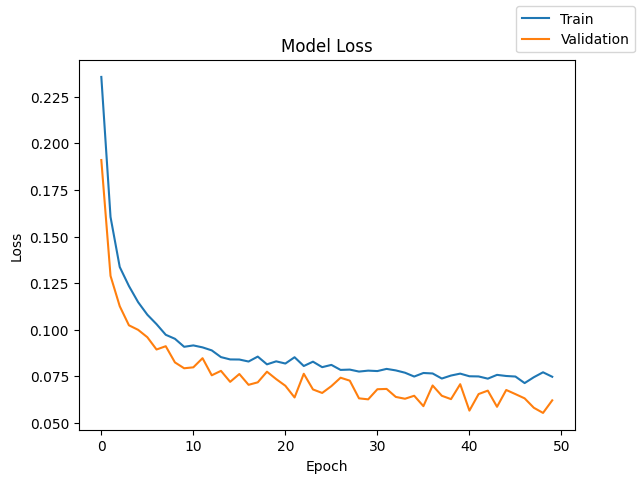

In [76]:
plot(history6,'loss')

$$
\boxed{
\begin{aligned}
&\text{1. Rapid decrease in both curves during first 5 epochs indicates strong initial learning.} \\
&\text{2. Validation loss consistently lower than training loss suggests good generalization.} \\
\end{aligned}
}
$$

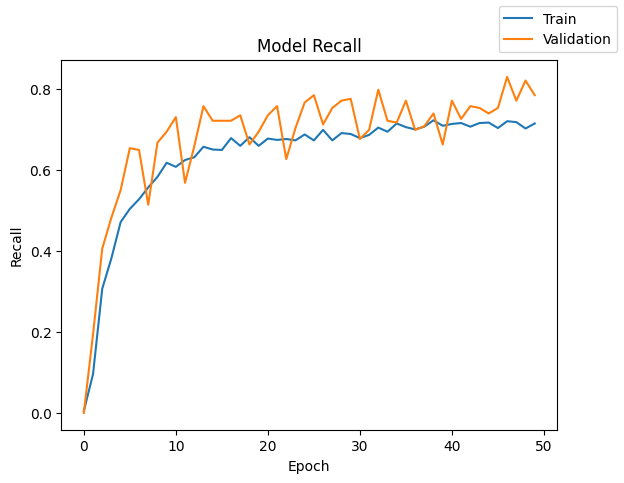

In [77]:
plot(history6,'recall')

$$
\boxed{
\begin{aligned}
&\text{1. Sharp initial increase for both curves during first 10 epochs shows rapid pattern recognition.} \\
&\text{2. Validation recall exhibits high volatility throughout training while exceeding training recall.} \\
&\text{3. Final validation recall reaches higher values despite oscillations, indicating better generalization.} \\
\end{aligned}
}
$$

In [78]:
results.loc[len(results)] = [
    2,  # Number of hidden layers
    [16, 8],  # Neurons in hidden layer
    ["ReLU", "ReLU"],  # Activation function
    50,  # Epochs
    32,  # Batch size
    "SGD",  # Optimizer
    [0.01, 0.9],  # Learning rate, momentum
    "-",  # Weight initializer
    "Dropout (0.1)",  # Regularization
    history6.history['loss'][-1],
    history6.history['val_loss'][-1],
    history6.history['recall'][-1],  
    history6.history['val_recall'][-1], 
    round(end-start,2)
]

In [79]:
results

,# hidden layers,# neurons - hidden layer,activation function - hidden layer,# epochs,batch size,optimizer,"learning rate, momentum",weight initializer,regularization,train loss,validation loss,train recall,validation recall,time (secs)
0,1,16,ReLU,50,32,SGD,"[0.01, -]",-,-,0.111683,0.113590,0.448198,0.518018,68.25
1,1,16,ReLU,50,32,SGD,"[0.01, 0.9]",-,-,0.074216,0.077015,0.700450,0.689189,58.96
2,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,-,0.057651,0.054069,0.784910,0.797297,65.61
3,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,Dropout (0.3),0.093040,0.060558,0.592342,0.761261,62.01
4,2,"[16, 8]","[ReLU, ReLU]",50,32,ADAM,[0.01],-,-,0.064352,0.073845,0.773649,0.648649,61.71
5,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,Dropout (0.1),0.074650,0.061987,0.713964,0.783784,64.10


$$
\boxed{
\begin{aligned}
&\text{1. The current model reintroduces Dropout (0.1) regularization with SGD and momentum, replacing the previous ADAM optimizer.} \\
&\text{2. The validation recall decreases slightly compared to the previous best model's (model3), indicating that Dropout (0.1) may reduce overfitting but also impacts generalization.} \\
&\text{3. The difference between training recall of the current model to the previous best model is very high.}\\
&\text{4. Both training and validation loss are higher in the current model compared to the previou best model, reflecting the regularization effect of Dropout.} \\
&\text{} \\
&\text{Conclusion: While Dropout (0.1) reduces overfitting, it slightly lowers recall and increases loss.}
\end{aligned}
}
$$

### 🚀 **Model 7 : WEIGHT INITIALIZATION IN MODEL 3**

In [82]:
# clears the current Keras session, resetting all layers and models previously created, freeing up memory and resources.
tf.keras.backend.clear_session()

In [83]:
model_7 = Sequential([
    Dense(16, activation='relu', input_shape=(X_train.shape[1],), kernel_initializer=GlorotNormal()),  # Hidden layer with 16 neurons
    Dense(8, activation='relu'),  # Second hidden layer with 8 neurons
    Dense(1, activation='sigmoid')  # Output layer with sigmoid activation for binary classification
])

model_7.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9), 
                loss='binary_crossentropy', 
                metrics=['accuracy', Recall()])  # Include accuracy and recall

In [84]:
start = time.time()
history7 = model_7.fit(X_train_scaled, y_train, validation_data=(X_val_scaled,y_val) , batch_size=batch_size, epochs=epochs)
end=time.time()

Epoch 1/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9456 - loss: 0.2259 - recall: 0.0000e+00 - val_accuracy: 0.9450 - val_loss: 0.1685 - val_recall: 0.0090
Epoch 2/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9497 - loss: 0.1513 - recall: 0.0925 - val_accuracy: 0.9585 - val_loss: 0.1268 - val_recall: 0.3198
Epoch 3/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9611 - loss: 0.1251 - recall: 0.3570 - val_accuracy: 0.9643 - val_loss: 0.1191 - val_recall: 0.5090
Epoch 4/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9631 - loss: 0.1202 - recall: 0.4253 - val_accuracy: 0.9657 - val_loss: 0.1154 - val_recall: 0.5135
Epoch 5/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9642 - loss: 0.1181 - recall: 0.4411 - val_accuracy: 0.9665 - val_loss: 0.1141 - val_recall: 0.5045
Epoch 6/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9647 - loss: 0.1163 - recall: 0.4498 - val_accuracy: 0.9655 - val_loss: 0.1106 - val_recall: 0.4685


In [85]:
print("Time taken in seconds ",end-start)

Time taken in seconds  60.22939085960388


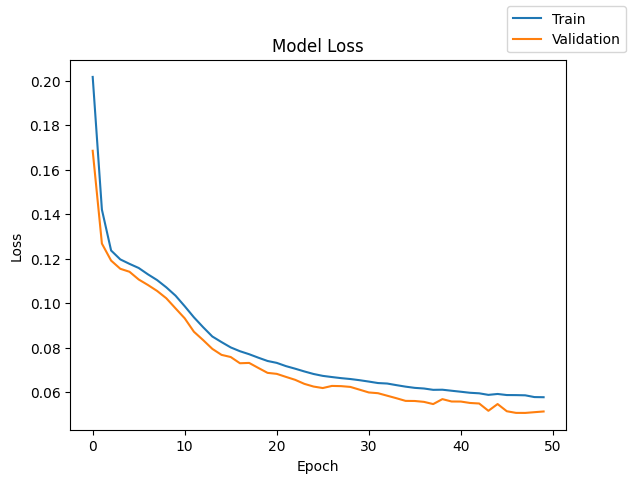

In [86]:
plot(history7,'loss')

$$
\boxed{
\begin{aligned}
&\text{1. Rapid decrease in both curves during first few epochs indicates effective early learning.} \\
&\text{2. Both curves gradually converge toward similar values by epoch 50 without signs of overfitting.} \\
\end{aligned}
}
$$

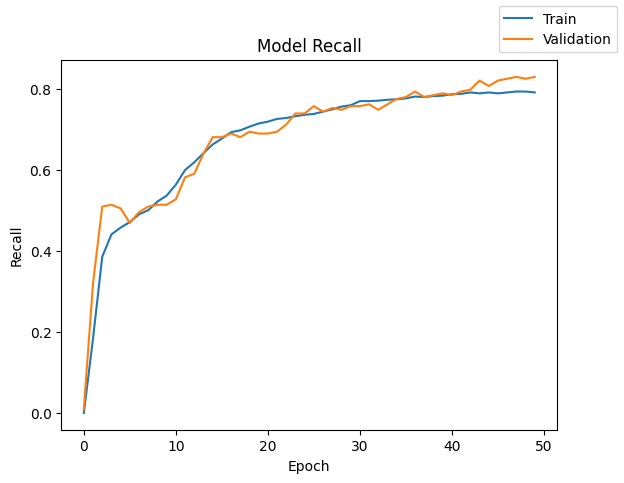

In [87]:
plot(history7,'recall')

$$
\boxed{
\begin{aligned}
&\text{1. Sharp initial increase from zero to moderate recall values in first few epochs.} \\
&\text{2. Validation recall shows more fluctuations while maintaining similar overall trajectory to training.} \\
&\text{3. Final validation recall slightly exceeds training recall, suggesting good generalization ability.} \\
\end{aligned}
}
$$

In [88]:
results.loc[len(results)] = [
    2,  # Number of hidden layers
    [16, 8],  # Neurons in hidden layer
    ["ReLU", "ReLU"],  # Activation function
    50,  # Epochs
    32,  # Batch size
    "SGD",  # Optimizer
    [0.01, 0.9],  # Learning rate, momentum
    "Glorot Normal",  # Weight initializer
    "-",  # Regularization
    history7.history['loss'][-1],
    history7.history['val_loss'][-1],
    history7.history['recall'][-1],  
    history7.history['val_recall'][-1], 
    round(end-start,2)
]

In [89]:
results

,# hidden layers,# neurons - hidden layer,activation function - hidden layer,# epochs,batch size,optimizer,"learning rate, momentum",weight initializer,regularization,train loss,validation loss,train recall,validation recall,time (secs)
0,1,16,ReLU,50,32,SGD,"[0.01, -]",-,-,0.111683,0.113590,0.448198,0.518018,68.25
1,1,16,ReLU,50,32,SGD,"[0.01, 0.9]",-,-,0.074216,0.077015,0.700450,0.689189,58.96
2,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,-,0.057651,0.054069,0.784910,0.797297,65.61
3,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,Dropout (0.3),0.093040,0.060558,0.592342,0.761261,62.01
4,2,"[16, 8]","[ReLU, ReLU]",50,32,ADAM,[0.01],-,-,0.064352,0.073845,0.773649,0.648649,61.71
5,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,Dropout (0.1),0.074650,0.061987,0.713964,0.783784,64.10
6,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,-,0.057733,0.051328,0.790541,0.828829,60.23


$$
\boxed{
\begin{aligned}
&\text{1. The current model introduces Glorot Normal weight initialization, replacing the previous model's default initialization and Dropout (0.1).} \\
&\text{2. The validation recall improves significantly compared to the previous best model (model3), indicating better generalization.} \\
&\text{3. The training recall is comparable to the earlier best model, showing effective learning without overfitting.} \\
&\text{4. Both training and validation loss are lower in the current model compared to the previous best model, reflecting improved performance.} \\
&\text{} \\
&\text{Conclusion: The addition of Glorot Normal initialization enhances model performance, making this the best model so far with higher recall and lower loss metrics.}
\end{aligned}
}
$$

### 🚀 **Model 8 : LOWERING LEARNING RATE IN MODEL 7**

In [90]:
# clears the current Keras session, resetting all layers and models previously created, freeing up memory and resources.
tf.keras.backend.clear_session()

In [91]:
model_8 = Sequential([
    Dense(16, activation='relu', input_shape=(X_train.shape[1],), kernel_initializer=GlorotNormal()),  # Hidden layer with 16 neurons
    Dense(8, activation='relu'),  # Second hidden layer with 8 neurons
    Dense(1, activation='sigmoid')  # Output layer with sigmoid activation for binary classification
])

model_8.compile(optimizer=SGD(learning_rate=0.001, momentum=0.9), 
                loss='binary_crossentropy', 
                metrics=['accuracy', Recall()])  # Include accuracy and recall

In [92]:
start = time.time()
history8 = model_8.fit(X_train_scaled, y_train, validation_data=(X_val_scaled,y_val) , batch_size=batch_size, epochs=epochs)
end=time.time()

Epoch 1/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9422 - loss: 0.3341 - recall: 0.0053 - val_accuracy: 0.9445 - val_loss: 0.2103 - val_recall: 0.0000e+00
Epoch 2/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9456 - loss: 0.2062 - recall: 0.0000e+00 - val_accuracy: 0.9445 - val_loss: 0.2067 - val_recall: 0.0000e+00
Epoch 3/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9456 - loss: 0.2023 - recall: 0.0000e+00 - val_accuracy: 0.9445 - val_loss: 0.2024 - val_recall: 0.0000e+00
Epoch 4/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9456 - loss: 0.1977 - recall: 0.0000e+00 - val_accuracy: 0.9445 - val_loss: 0.1973 - val_recall: 0.0000e+00
Epoch 5/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9456 - loss: 0.1923 - recall: 0.0000e+00 - val_accuracy: 0.9445 - val_loss: 0.1913 - val_recall: 0.0000e+00
Epoch 6/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9456 - loss: 0.1860 - recall: 0.0000e+00 - val_accuracy: 0.9445 - va

In [93]:
print("Time taken in seconds ",end-start)

Time taken in seconds  60.70502805709839


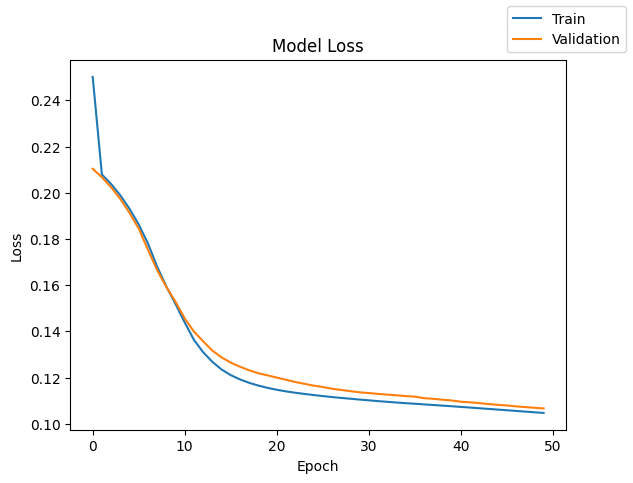

In [94]:
plot(history8,'loss')

$$
\boxed{
\begin{aligned}
&\text{1. Smooth convergence of both curves after epoch 20 suggests stable learning dynamics.} \\
\end{aligned}
}
$$

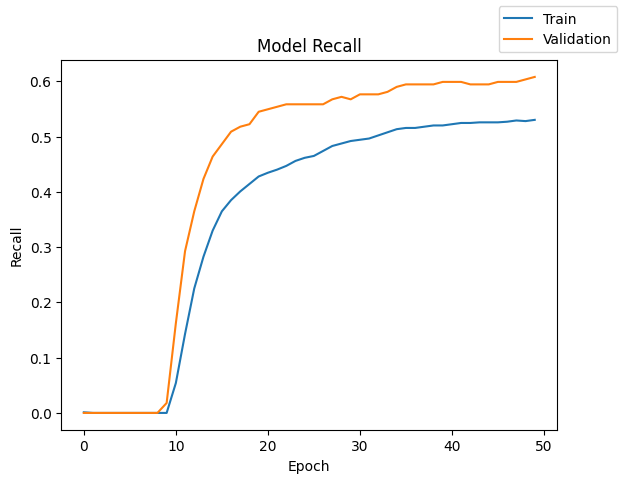

In [95]:
plot(history8,'recall')

$$
\boxed{
\begin{aligned}
&\text{1. Both curves show consistent upward trends, with validation recall stabilizing at higher values.} \\
&\text{2. Final gap between training and validation recall suggests the model performs better on unseen data.} \\
\end{aligned}
}
$$

In [96]:
results.loc[len(results)] = [
    2,  # Number of hidden layers
    [16, 8],  # Neurons in hidden layer
    ["ReLU", "ReLU"],  # Activation function
    50,  # Epochs
    32,  # Batch size
    "SGD",  # Optimizer
    [0.001, 0.9],  # Learning rate, momentum
    "Glorot Normal",  # Weight initializer
    "-",  # Regularization
    history8.history['loss'][-1],
    history8.history['val_loss'][-1],
    history8.history['recall'][-1],  
    history8.history['val_recall'][-1], 
    round(end-start,2)
]

In [97]:
results

,# hidden layers,# neurons - hidden layer,activation function - hidden layer,# epochs,batch size,optimizer,"learning rate, momentum",weight initializer,regularization,train loss,validation loss,train recall,validation recall,time (secs)
0,1,16,ReLU,50,32,SGD,"[0.01, -]",-,-,0.111683,0.113590,0.448198,0.518018,68.25
1,1,16,ReLU,50,32,SGD,"[0.01, 0.9]",-,-,0.074216,0.077015,0.700450,0.689189,58.96
2,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,-,0.057651,0.054069,0.784910,0.797297,65.61
3,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,Dropout (0.3),0.093040,0.060558,0.592342,0.761261,62.01
4,2,"[16, 8]","[ReLU, ReLU]",50,32,ADAM,[0.01],-,-,0.064352,0.073845,0.773649,0.648649,61.71
5,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,Dropout (0.1),0.074650,0.061987,0.713964,0.783784,64.10
6,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,-,0.057733,0.051328,0.790541,0.828829,60.23
7,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.001, 0.9]",Glorot Normal,-,0.104680,0.106638,0.530405,0.608108,60.71


$$
\boxed{
\begin{aligned}
&\text{1. The current model reduces the learning rate from 0.01 to 0.001 while retaining the same architecture and Glorot Normal initialization.} \\
&\text{2. The validation recall drops significantly to compared to the previous best model (model 7), indicating that the smaller learning rate hinders convergence.} \\
&\text{3. The training recall is also much lower than the previous best model, suggesting underfitting due to the slower learning process.} \\
&\text{4. Both training and validation loss are higher in the current model compared to the previous best model, reflecting poorer performance.} \\
&\text{} \\
&\text{Conclusion: Reducing the learning rate to 0.001 results in underfitting and significantly worse performance. The previous best model with a learning rate of 0.01 remains superior.}
\end{aligned}
}
$$

### 🚀 **Model 9 : ADDING DROPOUT LAYER IN MODEL 7**

In [100]:
# clears the current Keras session, resetting all layers and models previously created, freeing up memory and resources.
tf.keras.backend.clear_session()

In [101]:
model_9 = Sequential([
    Dense(16, activation='relu', input_shape=(X_train.shape[1],), kernel_initializer=GlorotNormal()),  # Hidden layer with 16 neurons
    Dropout(0.1),
    Dense(8, activation='relu'),  # Second hidden layer with 8 neurons
    Dropout(0.1),
    Dense(1, activation='sigmoid')  # Output layer with sigmoid activation for binary classification
])

model_9.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9), 
                loss='binary_crossentropy', 
                metrics=['accuracy', Recall()])  # Include accuracy and recall

In [102]:
start = time.time()
history9 = model_9.fit(X_train_scaled, y_train, validation_data=(X_val_scaled,y_val) , batch_size=batch_size, epochs=epochs)
end=time.time()

Epoch 1/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9437 - loss: 0.2455 - recall: 0.0000e+00 - val_accuracy: 0.9445 - val_loss: 0.1823 - val_recall: 0.0000e+00
Epoch 2/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9456 - loss: 0.1713 - recall: 0.0000e+00 - val_accuracy: 0.9445 - val_loss: 0.1388 - val_recall: 0.0000e+00
Epoch 3/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9456 - loss: 0.1462 - recall: 0.0000e+00 - val_accuracy: 0.9445 - val_loss: 0.1326 - val_recall: 0.0000e+00
Epoch 4/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9481 - loss: 0.1388 - recall: 0.0536 - val_accuracy: 0.9580 - val_loss: 0.1216 - val_recall: 0.2973
Epoch 5/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9577 - loss: 0.1333 - recall: 0.2926 - val_accuracy: 0.9628 - val_loss: 0.1175 - val_recall: 0.3423
Epoch 6/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9611 - loss: 0.1306 - recall: 0.3800 - val_accuracy: 0.9663 - val_loss: 0.1116 -

In [103]:
print("Time taken in seconds ",end-start)

Time taken in seconds  64.15416812896729


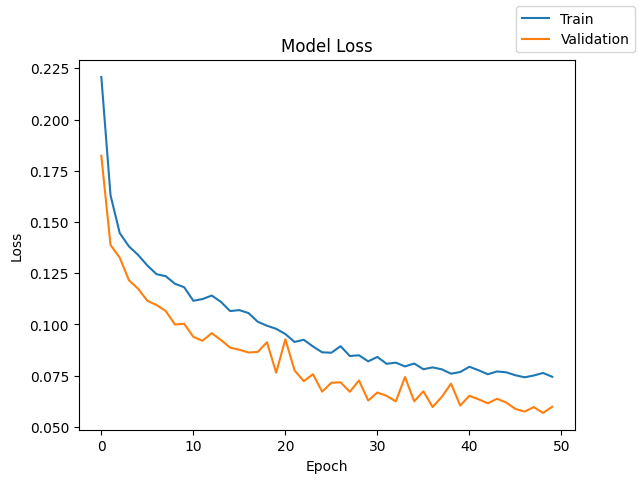

In [104]:
plot(history9,'loss')

$$
\boxed{
\begin{aligned}
&\text{1. Validation loss remains consistently lower than training loss, indicating good generalization.} \\
&\text{2. Both curves stabilize toward the end} \\
\end{aligned}
}
$$

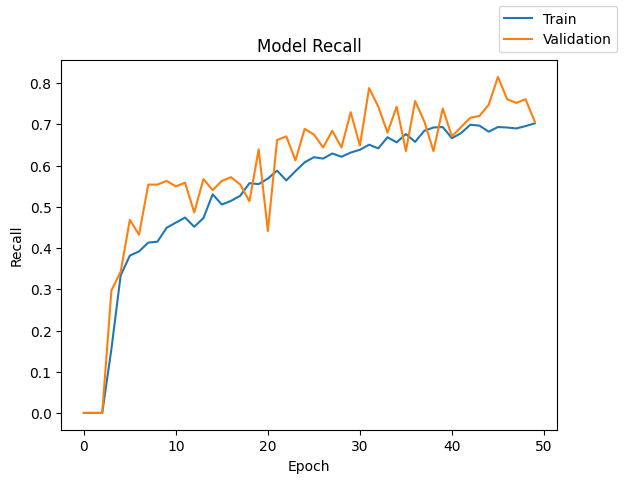

In [105]:
plot(history9,'recall')

$$
\boxed{
\begin{aligned}
&\text{1. Training recall increases steadily, showing consistent learning progress.} \\
&\text{2. Validation recall fluctuates significantly but trends upward overall, surpassing training recall.} \\
\end{aligned}
}
$$

In [106]:
results.loc[len(results)] = [
    2,  # Number of hidden layers
    [16, 8],  # Neurons in hidden layer
    ["ReLU", "ReLU"],  # Activation function
    50,  # Epochs
    32,  # Batch size
    "SGD",  # Optimizer
    [0.01, 0.9],  # Learning rate, momentum
    "Glorot Normal",  # Weight initializer
    "Dropout (0.1)",  # Regularization
    history9.history['loss'][-1],
    history9.history['val_loss'][-1],
    history9.history['recall'][-1],  
    history9.history['val_recall'][-1], 
    round(end-start,2)
]

In [107]:
results

,# hidden layers,# neurons - hidden layer,activation function - hidden layer,# epochs,batch size,optimizer,"learning rate, momentum",weight initializer,regularization,train loss,validation loss,train recall,validation recall,time (secs)
0,1,16,ReLU,50,32,SGD,"[0.01, -]",-,-,0.111683,0.113590,0.448198,0.518018,68.25
1,1,16,ReLU,50,32,SGD,"[0.01, 0.9]",-,-,0.074216,0.077015,0.700450,0.689189,58.96
2,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,-,0.057651,0.054069,0.784910,0.797297,65.61
3,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,Dropout (0.3),0.093040,0.060558,0.592342,0.761261,62.01
4,2,"[16, 8]","[ReLU, ReLU]",50,32,ADAM,[0.01],-,-,0.064352,0.073845,0.773649,0.648649,61.71
5,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,Dropout (0.1),0.074650,0.061987,0.713964,0.783784,64.10
6,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,-,0.057733,0.051328,0.790541,0.828829,60.23
7,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.001, 0.9]",Glorot Normal,-,0.104680,0.106638,0.530405,0.608108,60.71
8,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,Dropout (0.1),0.074488,0.059844,0.702703,0.707207,64.15


$$
\boxed{
\begin{aligned}
&\text{1. The current model introduces Dropout (0.1) regularization, while retaining the same architecture and Glorot Normal initialization as the previous best model (model 7).} \\
&\text{2. The validation recall decreases significantly compared to the previous best model, indicating that Dropout (0.1) negatively impacts generalization in this case.} \\
&\text{3. The training recall is also lower than the previous best model, suggesting that Dropout reduces overfitting but also limits the model's ability to learn effectively.} \\
&\text{4. Both training and validation loss are higher in the current model compared to the previous best model.} \\
&\text{} \\
&\text{Conclusion: The addition of Dropout (0.1) leads to a drop in both recall and loss metrics, making this model inferior to the previous best model without Dropout.}
\end{aligned}
}
$$

### 🚀 **Model 10 : INCREASING NEURONS IN MODEL 7**

In [108]:
# clears the current Keras session, resetting all layers and models previously created, freeing up memory and resources.
tf.keras.backend.clear_session()

In [109]:
model_10 = Sequential([
    Dense(32, activation='relu', input_shape=(X_train.shape[1],), kernel_initializer=GlorotNormal()),  # Hidden layer with 16 neurons
    Dense(16, activation='relu'),  # Second hidden layer with 8 neurons
    Dense(1, activation='sigmoid')  # Output layer with sigmoid activation for binary classification
])

model_10.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9), 
                loss='binary_crossentropy', 
                metrics=['accuracy', Recall()])  # Include accuracy and recall

In [110]:
start = time.time()
history10 = model_10.fit(X_train_scaled, y_train, validation_data=(X_val_scaled,y_val) , batch_size=batch_size, epochs=epochs)
end=time.time()

Epoch 1/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9235 - loss: 0.2396 - recall: 0.0000e+00 - val_accuracy: 0.9463 - val_loss: 0.1505 - val_recall: 0.0315
Epoch 2/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9537 - loss: 0.1383 - recall: 0.1788 - val_accuracy: 0.9628 - val_loss: 0.1180 - val_recall: 0.4189
Epoch 3/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9631 - loss: 0.1193 - recall: 0.4011 - val_accuracy: 0.9665 - val_loss: 0.1139 - val_recall: 0.5360
Epoch 4/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9649 - loss: 0.1152 - recall: 0.4514 - val_accuracy: 0.9685 - val_loss: 0.1092 - val_recall: 0.5405
Epoch 5/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9660 - loss: 0.1120 - recall: 0.4726 - val_accuracy: 0.9700 - val_loss: 0.1048 - val_recall: 0.5631
Epoch 6/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9679 - loss: 0.1079 - recall: 0.4988 - val_accuracy: 0.9722 - val_loss: 0.0999 - val_recall: 0.5360


In [111]:
print("Time taken in seconds ",end-start)

Time taken in seconds  61.48187828063965


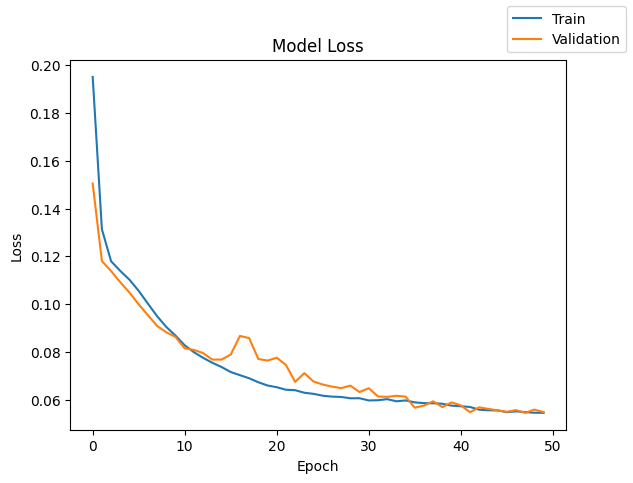

In [112]:
plot(history10,'loss')

$$
\boxed{
\begin{aligned}
&\text{1. Both curves show rapid initial decrease, with validation loss demonstrating fluctuations around epochs 15-20 before both converge toward similar values by epoch 50.} \\
\end{aligned}
}
$$


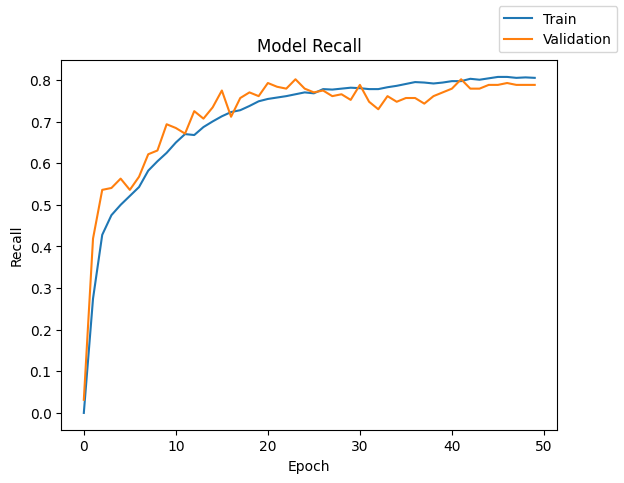

In [113]:
plot(history10,'recall')

$$
\boxed{
\begin{aligned}
&\text{1. Both curves show rapid initial increase with validation recall exhibiting significant fluctuations throughout, while training recall follows a smoother upward trend before stabilizing around similar final values.} \\
\end{aligned}
}
$$

In [114]:
results.loc[len(results)] = [
    2,  # Number of hidden layers
    [32, 16],  # Neurons in hidden layer
    ["ReLU", "ReLU"],  # Activation function
    50,  # Epochs
    32,  # Batch size
    "SGD",  # Optimizer
    [0.01, 0.9],  # Learning rate, momentum
    "Glorot Normal",  # Weight initializer
    "-",  # Regularization
    history10.history['loss'][-1],
    history10.history['val_loss'][-1],
    history10.history['recall'][-1],  
    history10.history['val_recall'][-1], 
    round(end-start,2)
]

In [115]:
results

,# hidden layers,# neurons - hidden layer,activation function - hidden layer,# epochs,batch size,optimizer,"learning rate, momentum",weight initializer,regularization,train loss,validation loss,train recall,validation recall,time (secs)
0,1,16,ReLU,50,32,SGD,"[0.01, -]",-,-,0.111683,0.113590,0.448198,0.518018,68.25
1,1,16,ReLU,50,32,SGD,"[0.01, 0.9]",-,-,0.074216,0.077015,0.700450,0.689189,58.96
2,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,-,0.057651,0.054069,0.784910,0.797297,65.61
3,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,Dropout (0.3),0.093040,0.060558,0.592342,0.761261,62.01
4,2,"[16, 8]","[ReLU, ReLU]",50,32,ADAM,[0.01],-,-,0.064352,0.073845,0.773649,0.648649,61.71
5,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,Dropout (0.1),0.074650,0.061987,0.713964,0.783784,64.10
6,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,-,0.057733,0.051328,0.790541,0.828829,60.23
7,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.001, 0.9]",Glorot Normal,-,0.104680,0.106638,0.530405,0.608108,60.71
8,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,Dropout (0.1),0.074488,0.059844,0.702703,0.707207,64.15
9,2,"[32, 16]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,-,0.054479,0.054764,0.805180,0.788288,61.48


$$
\boxed{
\begin{aligned}
&\text{1. The current model increases the number of neurons in the hidden layers from [16, 8] to [32, 16], while retaining Glorot Normal initialization and no regularization.} \\
&\text{2. The validation recall decreases slightly compared to the previous best model (model 7), indicating that the larger architecture does not improve generalization in this case.} \\
&\text{3. The training recall is slightly higher than the previous best model, suggesting that the larger model learns more effectively but struggles to generalize as well.} \\
&\text{4. Both training and validation loss are slightly higher in the current model compared to the previous best model, reflecting reduced performance.} \\
&\text{} \\
&\text{Conclusion: Increasing the number of neurons does not yield better results, as the current model performs worse in terms of validation recall and generalization compared to the previous best model.}
\end{aligned}
}
$$

### 🚀 **Model 11 : REDUCING BATCH SIZE IN MODEL 7**

In [116]:
# clears the current Keras session, resetting all layers and models previously created, freeing up memory and resources.
tf.keras.backend.clear_session()

In [117]:
model_11 = Sequential([
    Dense(16, activation='relu', input_shape=(X_train.shape[1],), kernel_initializer=GlorotNormal()),  # Hidden layer with 16 neurons
    Dense(8, activation='relu'),  # Second hidden layer with 8 neurons
    Dense(1, activation='sigmoid')  # Output layer with sigmoid activation for binary classification
])

model_11.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9), 
                loss='binary_crossentropy', 
                metrics=['accuracy', Recall()])  # Include accuracy and recall

In [118]:
start = time.time()
history11 = model_11.fit(X_train_scaled, y_train, validation_data=(X_val_scaled,y_val) , batch_size=16, epochs=epochs)
end=time.time()

Epoch 1/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.9457 - loss: 0.2064 - recall: 0.0027 - val_accuracy: 0.9597 - val_loss: 0.1411 - val_recall: 0.4234
Epoch 2/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9571 - loss: 0.1346 - recall: 0.2813 - val_accuracy: 0.9643 - val_loss: 0.1339 - val_recall: 0.6261
Epoch 3/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9606 - loss: 0.1258 - recall: 0.3811 - val_accuracy: 0.9665 - val_loss: 0.1290 - val_recall: 0.6667
Epoch 4/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9630 - loss: 0.1185 - recall: 0.4189 - val_accuracy: 0.9678 - val_loss: 0.1245 - val_recall: 0.6847
Epoch 5/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9657 - loss: 0.1120 - recall: 0.4607 - val_accuracy: 0.9720 - val_loss: 0.1115 - val_recall: 0.6802
Epoch 6/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9693 - loss: 0.1054 - recall: 0.4989 - val_accuracy: 0.9780 - val_loss: 0.1009 - val_recall:

In [119]:
print("Time taken in seconds ",end-start)

Time taken in seconds  114.02497935295105


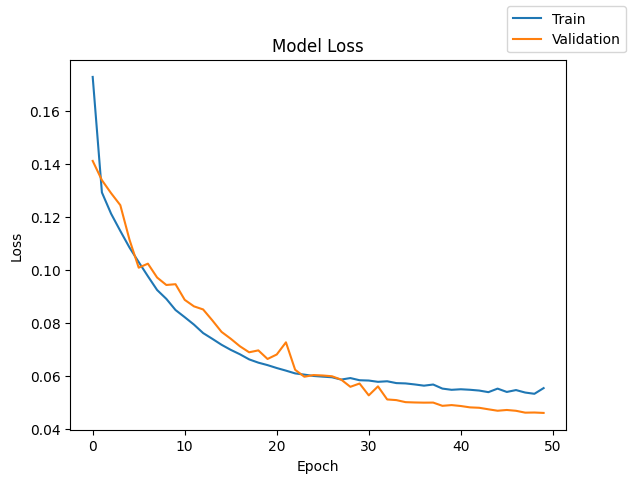

In [120]:
plot(history11,'loss')

$$
\boxed{
\begin{aligned}
&\text{1. Both curves show rapid initial decrease, with validation loss consistently lower than training loss.} \\
\end{aligned}
}
$$


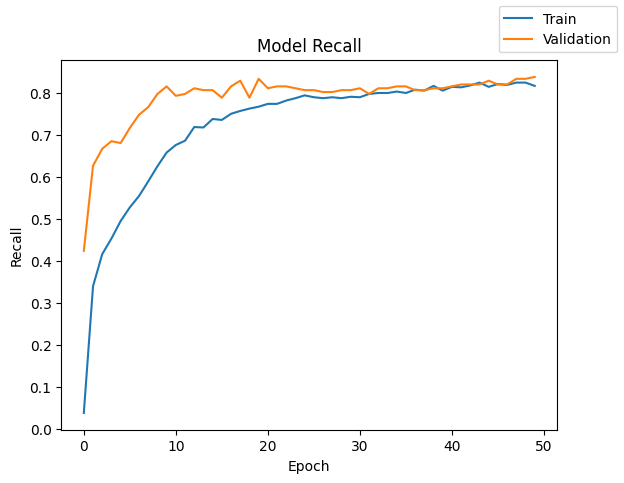

In [121]:
plot(history11,'recall')

$$
\boxed{
\begin{aligned}
&\text{1. Validation recall rises sharply early, surpassing training recall throughout the epochs.} \\
&\text{2. Training recall improves steadily, with both curves stabilizing at similar levels by epoch 50.} \\
\end{aligned}
}
$$

In [122]:
results.loc[len(results)] = [
    2,  # Number of hidden layers
    [16, 8],  # Neurons in hidden layer
    ["ReLU", "ReLU"],  # Activation function
    50,  # Epochs
    16,  # Batch size
    "SGD",  # Optimizer
    [0.01, 0.9],  # Learning rate, momentum
    "Glorot Normal",  # Weight initializer
    "-",  # Regularization
    history11.history['loss'][-1],
    history11.history['val_loss'][-1],
    history11.history['recall'][-1],  
    history11.history['val_recall'][-1], 
    round(end-start,2)
]

In [123]:
results

,# hidden layers,# neurons - hidden layer,activation function - hidden layer,# epochs,batch size,optimizer,"learning rate, momentum",weight initializer,regularization,train loss,validation loss,train recall,validation recall,time (secs)
0,1,16,ReLU,50,32,SGD,"[0.01, -]",-,-,0.111683,0.113590,0.448198,0.518018,68.25
1,1,16,ReLU,50,32,SGD,"[0.01, 0.9]",-,-,0.074216,0.077015,0.700450,0.689189,58.96
2,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,-,0.057651,0.054069,0.784910,0.797297,65.61
3,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,Dropout (0.3),0.093040,0.060558,0.592342,0.761261,62.01
4,2,"[16, 8]","[ReLU, ReLU]",50,32,ADAM,[0.01],-,-,0.064352,0.073845,0.773649,0.648649,61.71
5,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,Dropout (0.1),0.074650,0.061987,0.713964,0.783784,64.10
6,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,-,0.057733,0.051328,0.790541,0.828829,60.23
7,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.001, 0.9]",Glorot Normal,-,0.104680,0.106638,0.530405,0.608108,60.71
8,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,Dropout (0.1),0.074488,0.059844,0.702703,0.707207,64.15
9,2,"[32, 16]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,-,0.054479,0.054764,0.805180,0.788288,61.48


$$
\boxed{
\begin{aligned}
&\text{1. The current model reduces the batch size from 32 to 16, while retaining the same architecture, Glorot Normal initialization, and no regularization as the previous best model.} \\
&\text{2. The validation recall improves slightly compared to the previous best model (model 7), indicating better generalization with the smaller batch size.} \\
&\text{3. The training recall is also higher than the previous best model, suggesting that the smaller batch size allows the model to learn more effectively.} \\
&\text{4. Both training and validation loss are lower in the current model compared to the previous best model, reflecting improved performance.} \\
&\text{} \\
&\text{Conclusion: Reducing the batch size to 16 enhances both recall and loss metrics, making this model superior to the previous best model.}
\end{aligned}
}
$$

### 🚀 **Model 12 : APPLYING WEIGHTS INITIALIZATION TO 2ND HIDDEN LAYER IN MODEL 11**

In [144]:
# clears the current Keras session, resetting all layers and models previously created, freeing up memory and resources.
tf.keras.backend.clear_session()

In [145]:
model_12 = Sequential([
    Dense(16, activation='relu', input_shape=(X_train.shape[1],), kernel_initializer=GlorotNormal()),  # Hidden layer with 16 neurons
    Dense(8, activation='relu', kernel_initializer=GlorotNormal()),  # Second hidden layer with 8 neurons
    Dense(1, activation='sigmoid')  # Output layer with sigmoid activation for binary classification
])

model_12.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9), 
                loss='binary_crossentropy', 
                metrics=['accuracy', Recall()])  # Include accuracy and recall

In [146]:
start = time.time()
history12 = model_12.fit(X_train_scaled, y_train, validation_data=(X_val_scaled,y_val) , batch_size=16, epochs=epochs)
end=time.time()

Epoch 1/50


1000/1000 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9304 - loss: 0.2140 - recall: 0.0023 - val_accuracy: 0.9592 - val_loss: 0.1434 - val_recall: 0.4640
Epoch 2/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9579 - loss: 0.1359 - recall: 0.3082 - val_accuracy: 0.9615 - val_loss: 0.1354 - val_recall: 0.6171
Epoch 3/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9606 - loss: 0.1277 - recall: 0.3852 - val_accuracy: 0.9635 - val_loss: 0.1310 - val_recall: 0.6261
Epoch 4/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9624 - loss: 0.1219 - recall: 0.4125 - val_accuracy: 0.9647 - val_loss: 0.1233 - val_recall: 0.6351
Epoch 5/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9645 - loss: 0.1151 - recall: 0.4580 - val_accuracy: 0.9657 - val_loss: 0.1207 - val_recall: 0.6937
Epoch 6/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9671 - loss: 0.1083 - recall: 0.4926 - val_accuracy: 0.9657 - val_loss: 0.1194 - val_recall: 0.7613
Epo

In [147]:
print("Time taken in seconds ",end-start)

Time taken in seconds  153.96524500846863


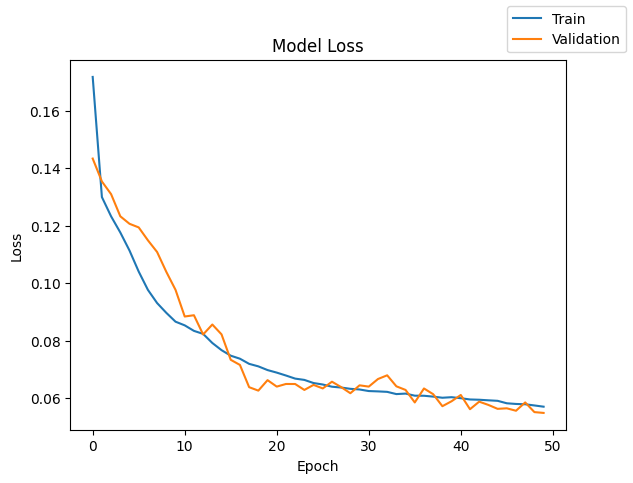

In [148]:
plot(history12,'loss')

$$
\boxed{
\begin{aligned}
&\text{1. Both curves show rapid initial decrease, with validation loss fluctuating slightly before stabilizing.} \\
&\text{2. Training loss converge smoothly.} \\
\end{aligned}
}
$$

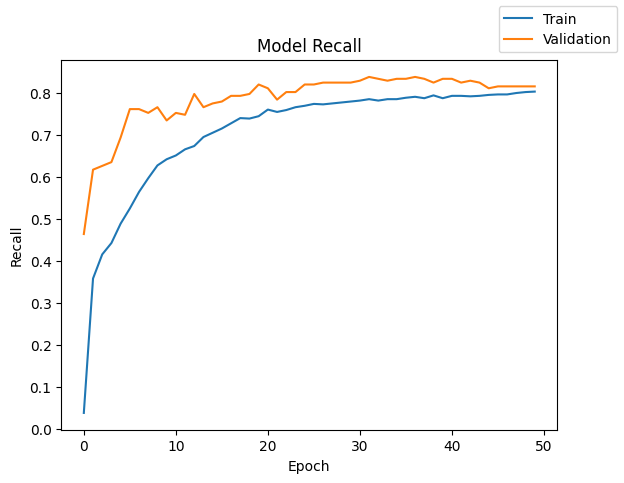

In [149]:
plot(history12,'recall')


$$\boxed{
\begin{aligned}
&\text{1. Validation recall rises sharply and remains consistently higher than training recall throughout.} \\
&\text{2. Training recall improves steadily, with both curves stabilizing toward the end.} \\
\end{aligned}
}
$$

In [150]:
results.loc[len(results)] = [
    2,  # Number of hidden layers
    [16, 8],  # Neurons in hidden layer
    ["ReLU", "ReLU"],  # Activation function
    50,  # Epochs
    16,  # Batch size
    "SGD",  # Optimizer
    [0.01, 0.9],  # Learning rate, momentum
    "Glorot Normal",  # Weight initializer
    "-",  # Regularization
    history12.history['loss'][-1],
    history12.history['val_loss'][-1],
    history12.history['recall'][-1],  
    history12.history['val_recall'][-1], 
    round(end-start,2)
]

# results['Class_Weight'] = ["-"]*(len(results)) + ['Balanced']

In [151]:
results

,# hidden layers,# neurons - hidden layer,activation function - hidden layer,# epochs,batch size,optimizer,"learning rate, momentum",weight initializer,regularization,train loss,validation loss,train recall,validation recall,time (secs)
0,1,16,ReLU,50,32,SGD,"[0.01, -]",-,-,0.111683,0.113590,0.448198,0.518018,68.25
1,1,16,ReLU,50,32,SGD,"[0.01, 0.9]",-,-,0.074216,0.077015,0.700450,0.689189,58.96
2,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,-,0.057651,0.054069,0.784910,0.797297,65.61
3,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,Dropout (0.3),0.093040,0.060558,0.592342,0.761261,62.01
4,2,"[16, 8]","[ReLU, ReLU]",50,32,ADAM,[0.01],-,-,0.064352,0.073845,0.773649,0.648649,61.71
5,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,Dropout (0.1),0.074650,0.061987,0.713964,0.783784,64.10
6,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,-,0.057733,0.051328,0.790541,0.828829,60.23
7,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.001, 0.9]",Glorot Normal,-,0.104680,0.106638,0.530405,0.608108,60.71
8,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,Dropout (0.1),0.074488,0.059844,0.702703,0.707207,64.15
9,2,"[32, 16]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,-,0.054479,0.054764,0.805180,0.788288,61.48


$$
\boxed{
\begin{aligned}
&\text{1. The current model applies weight initialization (Glorot Normal) to the second hidden layer, while keeping all other parameters identical to the previous best model (model 11).} \\
&\text{2. The validation recall decreases slightly compared to the previous best model, indicating a minor drop in generalization performance.} \\
&\text{3. The training recall is also lower than the previous best model, suggesting that the additional weight initialization does not enhance learning effectiveness.} \\
&\text{4. Both training and validation loss are higher in the current model compared to the previous best model, reflecting reduced performance.} \\
&\text{} \\
&\text{Conclusion: Applying weight initialization to the second hidden layer does not improve performance and instead results in slightly worse metrics compared to the previous best model.}
\end{aligned}
}
$$

### 🚀 **Model 13 : INCREASING EPOCHS**

In [160]:
#  clears the current Keras session, resetting all layers and models previously created, freeing up memory and resources.
tf.keras.backend.clear_session()

In [161]:
model_13 = Sequential([
    Dense(16, activation='relu', input_shape=(X_train.shape[1],), kernel_initializer=GlorotNormal()),  # Hidden layer with 16 neurons
    Dense(8, activation='relu'),  # Second hidden layer with 8 neurons
    Dense(1, activation='sigmoid')  # Output layer with sigmoid activation for binary classification
])

model_13.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9), 
                loss='binary_crossentropy', 
                metrics=['accuracy', Recall()])  # Include accuracy and recall

In [162]:
start = time.time()
history13 = model_13.fit(X_train_scaled, y_train, validation_data=(X_val_scaled,y_val) , batch_size=16, epochs=100)
end=time.time()

Epoch 1/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.9236 - loss: 0.2155 - recall: 0.0010 - val_accuracy: 0.9613 - val_loss: 0.1437 - val_recall: 0.4685
Epoch 2/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9578 - loss: 0.1349 - recall: 0.3004 - val_accuracy: 0.9635 - val_loss: 0.1343 - val_recall: 0.6171
Epoch 3/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9610 - loss: 0.1271 - recall: 0.3779 - val_accuracy: 0.9660 - val_loss: 0.1248 - val_recall: 0.6261
Epoch 4/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9645 - loss: 0.1185 - recall: 0.4230 - val_accuracy: 0.9670 - val_loss: 0.1196 - val_recall: 0.6532
Epoch 5/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9645 - loss: 0.1137 - recall: 0.4459 - val_accuracy: 0.9675 - val_loss: 0.1131 - val_recall: 0.6622
Epoch 6/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9675 - loss: 0.1083 - recall: 0.4803 - val_accuracy: 0.9707 - val_loss: 0.1024 - val_r

In [163]:
print("Time taken in seconds ",end-start)

Time taken in seconds  219.42532515525818


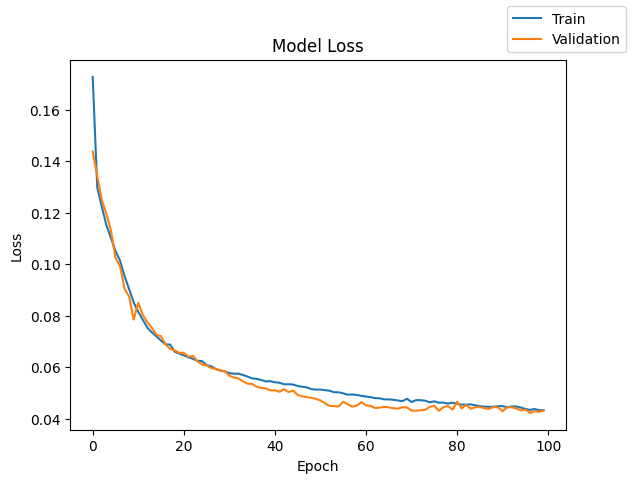

In [164]:
plot(history13,'loss')

$$  
\boxed{  
\begin{aligned}  
&\text{1. Both curves decrease rapidly initially, with validation loss slightly lower and converging smoothly by epoch 100.} \\  
\end{aligned}  
}  
$$   

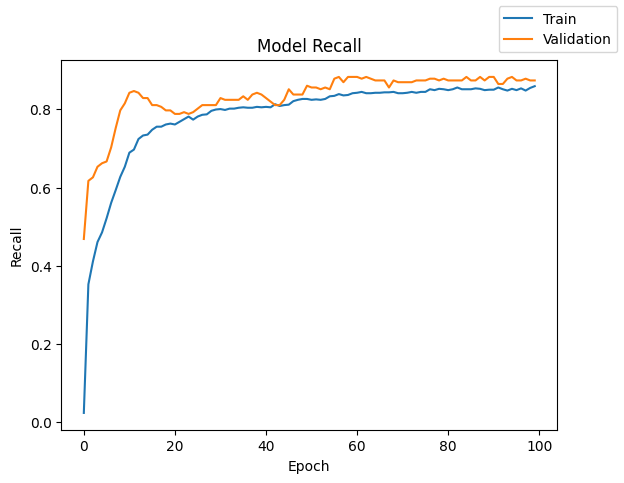

In [165]:
plot(history13,'recall')

$$  
\boxed{  
\begin{aligned}  
&\text{1. Validation recall rises sharply and fluctuates slightly, consistently exceeding training recall which improves steadily.} \\  
\end{aligned}  
}  
$$

In [166]:
results.loc[len(results)] = [
    2,  # Number of hidden layers
    [16, 8],  # Neurons in hidden layer
    ["ReLU", "ReLU"],  # Activation function
    100,  # Epochs
    16,  # Batch size
    "SGD",  # Optimizer
    [0.01, 0.9],  # Learning rate, momentum
    "Glorot Normal",  # Weight initializer
    "-",  # Regularization
    history13.history['loss'][-1],
    history13.history['val_loss'][-1],
    history13.history['recall'][-1],  
    history13.history['val_recall'][-1], 
    round(end-start,2)
]

In [167]:
results

,# hidden layers,# neurons - hidden layer,activation function - hidden layer,# epochs,batch size,optimizer,"learning rate, momentum",weight initializer,regularization,train loss,validation loss,train recall,validation recall,time (secs)
0,1,16,ReLU,50,32,SGD,"[0.01, -]",-,-,0.111683,0.113590,0.448198,0.518018,68.25
1,1,16,ReLU,50,32,SGD,"[0.01, 0.9]",-,-,0.074216,0.077015,0.700450,0.689189,58.96
2,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,-,0.057651,0.054069,0.784910,0.797297,65.61
3,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,Dropout (0.3),0.093040,0.060558,0.592342,0.761261,62.01
4,2,"[16, 8]","[ReLU, ReLU]",50,32,ADAM,[0.01],-,-,0.064352,0.073845,0.773649,0.648649,61.71
5,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,Dropout (0.1),0.074650,0.061987,0.713964,0.783784,64.10
6,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,-,0.057733,0.051328,0.790541,0.828829,60.23
7,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.001, 0.9]",Glorot Normal,-,0.104680,0.106638,0.530405,0.608108,60.71
8,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,Dropout (0.1),0.074488,0.059844,0.702703,0.707207,64.15
9,2,"[32, 16]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,-,0.054479,0.054764,0.805180,0.788288,61.48


$$
\boxed{
\begin{aligned}
&\text{1. The current model increases the number of epochs from 50 to 100, while retaining the same architecture, Glorot Normal initialization, and no regularization as the previous best model (model 11).} \\
&\text{2. The validation recall improves significantly compared to the previous best model, indicating better generalization with more training iterations.} \\
&\text{3. The training recall is also higher than the previous best model, suggesting that the additional epochs allow the model to learn more effectively.} \\
&\text{4. Both training and validation loss are lower in the current model compared to the previous best model, reflecting improved performance.} \\
&\text{} \\
&\text{Conclusion: While increasing the epochs to 100 yields the best results so far, the significant increase in training time makes it impractical for efficiency-focused scenarios. Future efforts should focus on achieving similar performance with fewer epochs.}
\end{aligned}
}
$$

### 🚀 **Model 14 : ADDING HIDDEN LAYER IN MODEL 11**

In [175]:
# clears the current Keras session, resetting all layers and models previously created, freeing up memory and resources.
tf.keras.backend.clear_session()

In [176]:
model_14 = Sequential([
    Dense(16, activation='relu', input_shape=(X_train.shape[1],), kernel_initializer=GlorotNormal()),  # Hidden layer with 16 neurons
    Dense(8, activation='relu'),  # Second hidden layer with 8 neurons
    Dense(4, activation='relu'),  # Second hidden layer with 8 neurons
    Dense(1, activation='sigmoid')  # Output layer with sigmoid activation for binary classification
])

model_14.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9), 
                loss='binary_crossentropy', 
                metrics=['accuracy', Recall()])  # Include accuracy and recall

In [177]:
start = time.time()
history14 = model_14.fit(X_train_scaled, y_train, validation_data=(X_val_scaled,y_val) , batch_size=16, epochs=epochs)  
end=time.time()

Epoch 1/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9331 - loss: 0.2308 - recall: 0.0034 - val_accuracy: 0.9617 - val_loss: 0.1452 - val_recall: 0.5676
Epoch 2/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9600 - loss: 0.1324 - recall: 0.3657 - val_accuracy: 0.9605 - val_loss: 0.1251 - val_recall: 0.6757
Epoch 3/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9634 - loss: 0.1217 - recall: 0.4597 - val_accuracy: 0.9685 - val_loss: 0.1034 - val_recall: 0.6532
Epoch 4/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9661 - loss: 0.1122 - recall: 0.4926 - val_accuracy: 0.9755 - val_loss: 0.0937 - val_recall: 0.6351
Epoch 5/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9700 - loss: 0.1028 - recall: 0.5504 - val_accuracy: 0.9793 - val_loss: 0.0847 - val_recall: 0.7117
Epoch 6/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9731 - loss: 0.0969 - recall: 0.5852 - val_accuracy: 0.9830 - val_loss: 0.0787 - val_recall:

In [178]:
print("Time taken in seconds ",end-start)

Time taken in seconds  115.8582694530487


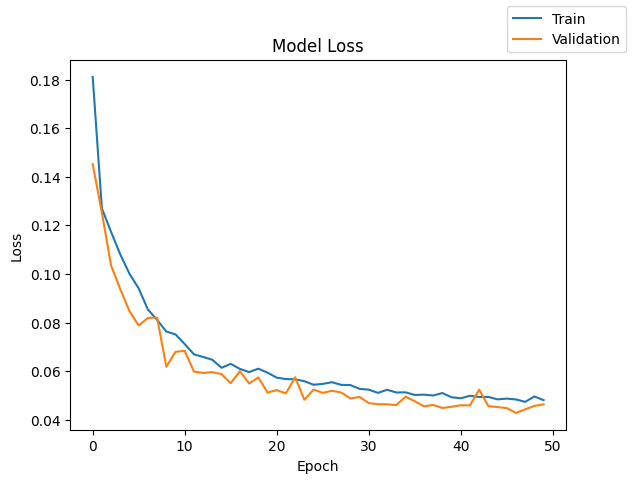

In [180]:
plot(history14,'loss')


$$  
\boxed{  
\begin{aligned}  
&\text{1. Both curves decrease rapidly initially, with validation loss consistently lower and converging smoothly by epoch 50.} \\  
\end{aligned}  
}  
$$  

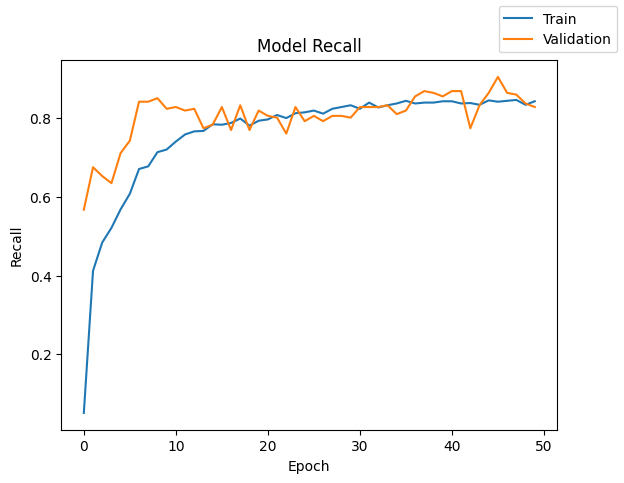

In [181]:
plot(history14,'recall')

$$  
\boxed{  
\begin{aligned}  
&\text{1. Validation recall fluctuates but remains higher than training recall} \\  
\end{aligned}  
}  
$$

In [182]:
results.loc[len(results)] = [
    3,  # Number of hidden layers
    [16, 8, 4],  # Neurons in hidden layer
    ["ReLU", "ReLU", "ReLU"],  # Activation function
    epochs,  # Epochs
    16,  # Batch size
    "SGD",  # Optimizer
    [0.01, 0.9],  # Learning rate, momentum
    "Glorot Normal",  # Weight initializer
    "-",  # Regularization
    history14.history['loss'][-1],
    history14.history['val_loss'][-1],
    history14.history['recall'][-1],  
    history14.history['val_recall'][-1], 
    round(end-start,2)
]

In [183]:
results

,# hidden layers,# neurons - hidden layer,activation function - hidden layer,# epochs,batch size,optimizer,"learning rate, momentum",weight initializer,regularization,train loss,validation loss,train recall,validation recall,time (secs)
0,1,16,ReLU,50,32,SGD,"[0.01, -]",-,-,0.111683,0.113590,0.448198,0.518018,68.25
1,1,16,ReLU,50,32,SGD,"[0.01, 0.9]",-,-,0.074216,0.077015,0.700450,0.689189,58.96
2,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,-,0.057651,0.054069,0.784910,0.797297,65.61
3,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,Dropout (0.3),0.093040,0.060558,0.592342,0.761261,62.01
4,2,"[16, 8]","[ReLU, ReLU]",50,32,ADAM,[0.01],-,-,0.064352,0.073845,0.773649,0.648649,61.71
5,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,Dropout (0.1),0.074650,0.061987,0.713964,0.783784,64.10
6,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,-,0.057733,0.051328,0.790541,0.828829,60.23
7,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.001, 0.9]",Glorot Normal,-,0.104680,0.106638,0.530405,0.608108,60.71
8,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,Dropout (0.1),0.074488,0.059844,0.702703,0.707207,64.15
9,2,"[32, 16]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,-,0.054479,0.054764,0.805180,0.788288,61.48


$$
\boxed{
\begin{aligned}
&\text{1. The current model increases the number of hidden layers from 2 to 3 ([16, 8] → [16, 8, 4]), while retaining Glorot Normal initialization and no regularization as the previous best model (model 11).} \\
&\text{2. The validation recall decreases slightly compared to the previous best model, indicating that adding an extra layer does not improve generalization in this case.} \\
&\text{3. The training recall is higher than the previous best model, suggesting that the deeper model learns more effectively but struggles to generalize as well.} \\
&\text{4. Both training and validation loss are slightly higher in the current model compared to the previous best model, reflecting reduced performance.} \\
&\text{} \\
&\text{Conclusion: Adding a third hidden layer does not yield better results, as the current model performs worse in terms of validation recall and generalization compared to the previous best model.}
\end{aligned}
}
$$

### 🚀 **Model 15 : GLOROT UNIFORM WEIGHT INITIALIZATION IN MODEL 14**

In [185]:
# clears the current Keras session, resetting all layers and models previously created, freeing up memory and resources.
tf.keras.backend.clear_session()

In [186]:
model_15 = Sequential([
    Dense(16, activation='relu', input_shape=(X_train.shape[1],), kernel_initializer=GlorotUniform()),  # Hidden layer with 16 neurons
    Dense(8, activation='relu'),  # Second hidden layer with 8 neurons
    Dense(4, activation='relu'),  # Second hidden layer with 8 neurons
    Dense(1, activation='sigmoid')  # Output layer with sigmoid activation for binary classification
])

model_15.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9), 
                loss='binary_crossentropy', 
                metrics=['accuracy', Recall()])  # Include accuracy and recall

In [187]:
start = time.time()
history15 = model_15.fit(X_train_scaled, y_train, validation_data=(X_val_scaled,y_val) , batch_size=16, epochs=epochs)  
end=time.time()

Epoch 1/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9436 - loss: 0.2375 - recall: 0.0155 - val_accuracy: 0.9603 - val_loss: 0.1446 - val_recall: 0.5991
Epoch 2/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9581 - loss: 0.1336 - recall: 0.3514 - val_accuracy: 0.9607 - val_loss: 0.1298 - val_recall: 0.6532
Epoch 3/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9618 - loss: 0.1240 - recall: 0.4198 - val_accuracy: 0.9672 - val_loss: 0.1124 - val_recall: 0.6532
Epoch 4/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9641 - loss: 0.1143 - recall: 0.4651 - val_accuracy: 0.9705 - val_loss: 0.1032 - val_recall: 0.6757
Epoch 5/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9682 - loss: 0.1063 - recall: 0.5328 - val_accuracy: 0.9728 - val_loss: 0.0920 - val_recall: 0.6261
Epoch 6/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9712 - loss: 0.0987 - recall: 0.5802 - val_accuracy: 0.9740 - val_loss: 0.1006 - val_recall:

In [188]:
print("Time taken in seconds ",end-start)

Time taken in seconds  114.99092531204224


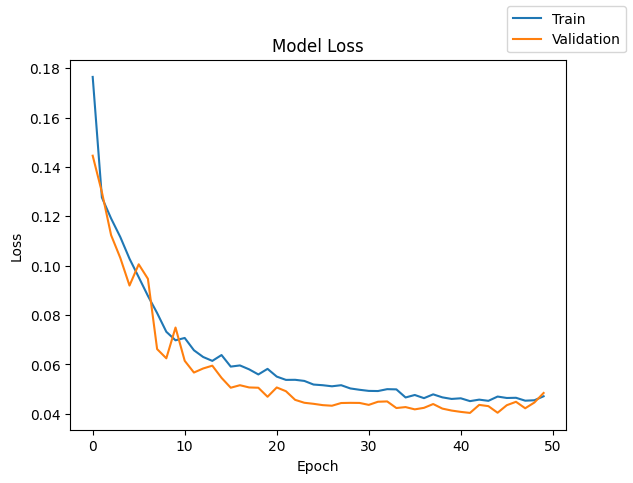

In [189]:
plot(history15,'loss')


$$  
\boxed{  
\begin{aligned}  
&\text{1. Both curves decrease rapidly initially, with validation loss consistently lower and stabilizing smoothly by epoch 50.} \\  
\end{aligned}  
}  
$$  
 

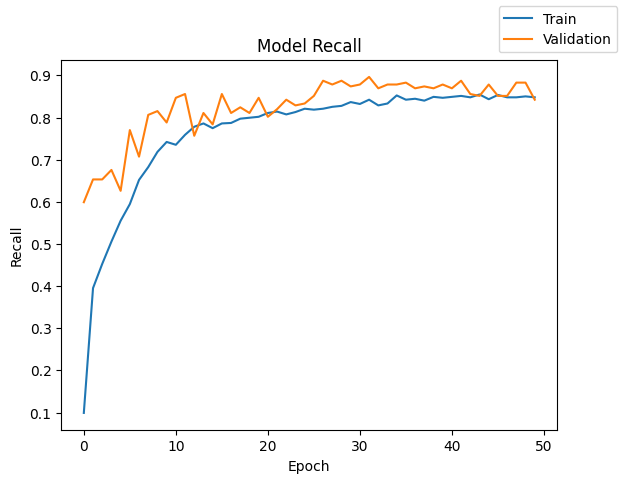

In [190]:
plot(history15,'recall')


$$  
\boxed{  
\begin{aligned}  
&\text{1. Validation recall fluctuates but remains higher than training recall} \\  
\end{aligned}  
}  
$$

In [191]:
results.loc[len(results)] = [
    3,  # Number of hidden layers
    [16, 8, 4],  # Neurons in hidden layer
    ["ReLU", "ReLU", "ReLU"],  # Activation function
    epochs,  # Epochs
    16,  # Batch size
    "SGD",  # Optimizer
    [0.01, 0.9],  # Learning rate, momentum
    "Glorot Uniform",  # Weight initializer
    "-",  # Regularization
    history15.history['loss'][-1],
    history15.history['val_loss'][-1],
    history15.history['recall'][-1],  
    history15.history['val_recall'][-1], 
    round(end-start,2)
]

In [192]:
results

,# hidden layers,# neurons - hidden layer,activation function - hidden layer,# epochs,batch size,optimizer,"learning rate, momentum",weight initializer,regularization,train loss,validation loss,train recall,validation recall,time (secs)
0,1,16,ReLU,50,32,SGD,"[0.01, -]",-,-,0.111683,0.113590,0.448198,0.518018,68.25
1,1,16,ReLU,50,32,SGD,"[0.01, 0.9]",-,-,0.074216,0.077015,0.700450,0.689189,58.96
2,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,-,0.057651,0.054069,0.784910,0.797297,65.61
3,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,Dropout (0.3),0.093040,0.060558,0.592342,0.761261,62.01
4,2,"[16, 8]","[ReLU, ReLU]",50,32,ADAM,[0.01],-,-,0.064352,0.073845,0.773649,0.648649,61.71
5,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,Dropout (0.1),0.074650,0.061987,0.713964,0.783784,64.10
6,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,-,0.057733,0.051328,0.790541,0.828829,60.23
7,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.001, 0.9]",Glorot Normal,-,0.104680,0.106638,0.530405,0.608108,60.71
8,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,Dropout (0.1),0.074488,0.059844,0.702703,0.707207,64.15
9,2,"[32, 16]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,-,0.054479,0.054764,0.805180,0.788288,61.48


$$
\boxed{
\begin{aligned}
&\text{1. The current model switches the weight initialization from Glorot Normal to Glorot Uniform, while retaining the same architecture and other parameters as the previous best model (model 11).} \\
&\text{2. The validation recall improves slightly compared to the previous best model, indicating marginally better generalization with Glorot Uniform initialization.} \\
&\text{3. The training recall is also higher than the previous best model, suggesting that Glorot Uniform helps the model learn more effectively.} \\
&\text{4. Both training and validation loss are slightly higher in the current model compared to the previous best model, but the differences are negligible.} \\
&\text{} \\
&\text{Conclusion: Switching to Glorot Uniform initialization results in a slight improvement in validation recall, making this model marginally better than the previous best model.}
\end{aligned}
}
$$

### 🚀 **Model 16 : INCREASING NEURONS IN HIDDEN LAYER IN MODEL 15**

In [194]:
#  clears the current Keras session, resetting all layers and models previously created, freeing up memory and resources.
tf.keras.backend.clear_session()

In [195]:
model_16 = Sequential([
    Dense(32, activation='relu', input_shape=(X_train.shape[1],), kernel_initializer=GlorotUniform()),  # Hidden layer with 16 neurons
    Dense(16, activation='relu'),  # Second hidden layer with 8 neurons
    Dense(8, activation='relu'),  # Second hidden layer with 8 neurons
    Dense(1, activation='sigmoid')  # Output layer with sigmoid activation for binary classification
])

model_16.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9), 
                loss='binary_crossentropy', 
                metrics=['accuracy', Recall()])  # Include accuracy and recall

In [196]:
start = time.time()
history16 = model_16.fit(X_train_scaled, y_train, validation_data=(X_val_scaled,y_val) , batch_size=16, epochs=epochs)  
end=time.time()

Epoch 1/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.9332 - loss: 0.2082 - recall: 0.0062 - val_accuracy: 0.9625 - val_loss: 0.1376 - val_recall: 0.5450
Epoch 2/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9605 - loss: 0.1317 - recall: 0.3586 - val_accuracy: 0.9668 - val_loss: 0.1162 - val_recall: 0.6036
Epoch 3/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9639 - loss: 0.1194 - recall: 0.4425 - val_accuracy: 0.9732 - val_loss: 0.0980 - val_recall: 0.6171
Epoch 4/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9682 - loss: 0.1089 - recall: 0.5022 - val_accuracy: 0.9770 - val_loss: 0.0882 - val_recall: 0.6712
Epoch 5/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9710 - loss: 0.1012 - recall: 0.5576 - val_accuracy: 0.9737 - val_loss: 0.0883 - val_recall: 0.5721
Epoch 6/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9719 - loss: 0.0976 - recall: 0.5697 - val_accuracy: 0.9768 - val_loss: 0.0820 - val_recall:

In [197]:
print("Time taken in seconds ",end-start)

Time taken in seconds  114.26782989501953


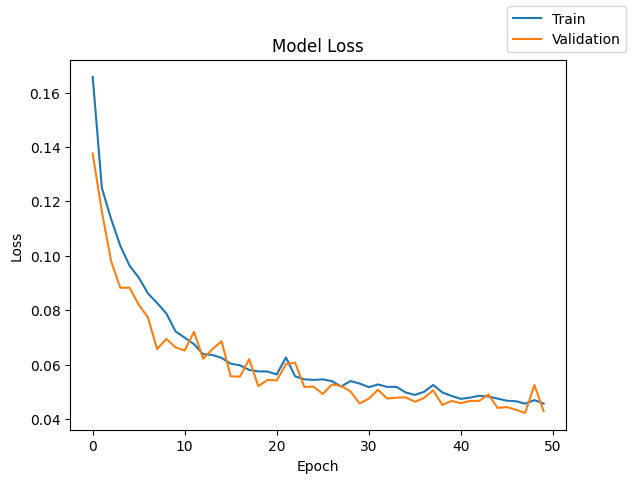

In [198]:
plot(history16,'loss')



$$
\boxed{
\begin{aligned}
&\text{1. The validation loss closely follows the training loss, showing the model generalizes well.} \\
&\text{2. Small fluctuations in validation loss towards the end suggest minor instability, but the overall trend is stable.} \\
\end{aligned}
}
$$




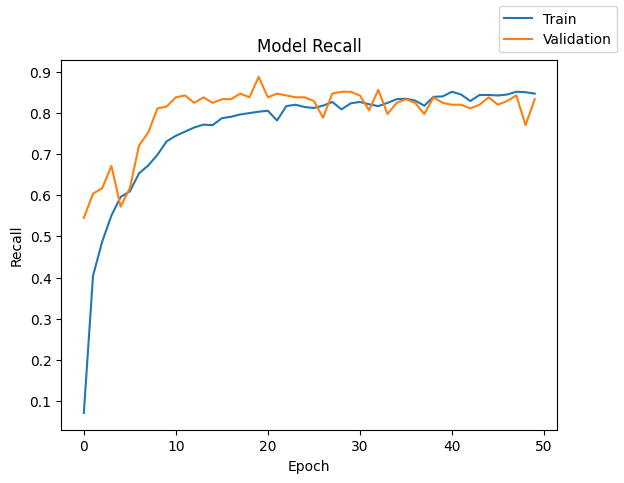

In [199]:
plot(history16,'recall')

$$
\boxed{
\begin{aligned}
&\text{1. Recall on the validation set slightly lags behind the training recall, but both follow similar trends.} \\
&\text{2. The final phase of recall fluctuation shows minor instability} \\
\end{aligned}
}
$$

In [200]:
results.loc[len(results)] = [
    3,  # Number of hidden layers
    [32, 16, 8],  # Neurons in hidden layer
    ["ReLU", "ReLU", "ReLU"],  # Activation function
    epochs,  # Epochs
    16,  # Batch size
    "SGD",  # Optimizer
    [0.01, 0.9],  # Learning rate, momentum
    "Glorot Uniform",  # Weight initializer
    "-",  # Regularization
    history16.history['loss'][-1],
    history16.history['val_loss'][-1],
    history16.history['recall'][-1],  
    history16.history['val_recall'][-1], 
    round(end-start,2)
]

In [201]:
results

,# hidden layers,# neurons - hidden layer,activation function - hidden layer,# epochs,batch size,optimizer,"learning rate, momentum",weight initializer,regularization,train loss,validation loss,train recall,validation recall,time (secs)
0,1,16,ReLU,50,32,SGD,"[0.01, -]",-,-,0.111683,0.113590,0.448198,0.518018,68.25
1,1,16,ReLU,50,32,SGD,"[0.01, 0.9]",-,-,0.074216,0.077015,0.700450,0.689189,58.96
2,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,-,0.057651,0.054069,0.784910,0.797297,65.61
3,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,Dropout (0.3),0.093040,0.060558,0.592342,0.761261,62.01
4,2,"[16, 8]","[ReLU, ReLU]",50,32,ADAM,[0.01],-,-,0.064352,0.073845,0.773649,0.648649,61.71
5,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,Dropout (0.1),0.074650,0.061987,0.713964,0.783784,64.10
6,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,-,0.057733,0.051328,0.790541,0.828829,60.23
7,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.001, 0.9]",Glorot Normal,-,0.104680,0.106638,0.530405,0.608108,60.71
8,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,Dropout (0.1),0.074488,0.059844,0.702703,0.707207,64.15
9,2,"[32, 16]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,-,0.054479,0.054764,0.805180,0.788288,61.48


$$
\boxed{
\begin{aligned}
&\text{1. The current model increases the number of neurons in the hidden layers from [16, 8, 4] to [32, 16, 8], while retaining Glorot Uniform initialization and no regularization as the previous best model (model 11).} \\
&\text{2. The validation recall improves slightly compared to the previous best model, indicating marginally better generalization with the larger architecture.} \\
&\text{3. The training recall is comparable to the previous best model, suggesting that the larger model does not significantly enhance learning effectiveness.} \\
&\text{4. Both training and validation loss are lower in the current model compared to the previous best model, reflecting improved performance.} \\
&\text{} \\
&\text{Conclusion: Increasing the number of neurons in the hidden layers results in slightly better metrics, making this model marginally superior to the previous best model.}
\end{aligned}
}
$$

### 🚀 **Model 17 : HE NORMAL WEIGHT INITIALIZATION IN MODEL 11**

In [207]:
# clears the current Keras session, resetting all layers and models previously created, freeing up memory and resources.
tf.keras.backend.clear_session()

In [209]:
model_17 = Sequential([
    Dense(16, activation='relu', input_shape=(X_train.shape[1],), kernel_initializer=he_normal()),  # Hidden layer with 16 neurons
    Dense(8, activation='relu'),  # Second hidden layer with 8 neurons
    Dense(1, activation='sigmoid')  # Output layer with sigmoid activation for binary classification
])

model_17.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9), 
                loss='binary_crossentropy', 
                metrics=['accuracy', Recall()])  # Include accuracy and recall

In [210]:
start = time.time()
history17 = model_17.fit(X_train_scaled, y_train, validation_data=(X_val_scaled,y_val) , batch_size=16, epochs=epochs)
end=time.time()

Epoch 1/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.9201 - loss: 0.2308 - recall_1: 0.0000e+00 - val_accuracy: 0.9445 - val_loss: 0.1498 - val_recall_1: 0.0000e+00
Epoch 2/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9515 - loss: 0.1363 - recall_1: 0.1326 - val_accuracy: 0.9620 - val_loss: 0.1374 - val_recall_1: 0.5766
Epoch 3/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9604 - loss: 0.1281 - recall_1: 0.3503 - val_accuracy: 0.9628 - val_loss: 0.1368 - val_recall_1: 0.6036
Epoch 4/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9616 - loss: 0.1257 - recall_1: 0.3903 - val_accuracy: 0.9643 - val_loss: 0.1286 - val_recall_1: 0.6306
Epoch 5/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9632 - loss: 0.1200 - recall_1: 0.4307 - val_accuracy: 0.9640 - val_loss: 0.1264 - val_recall_1: 0.6622
Epoch 6/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.9646 - loss: 0.1157 - recall_1: 0.4588 - val_accuracy: 0.9632 - 

In [211]:
print("Time taken in seconds ",end-start)

Time taken in seconds  111.51334381103516


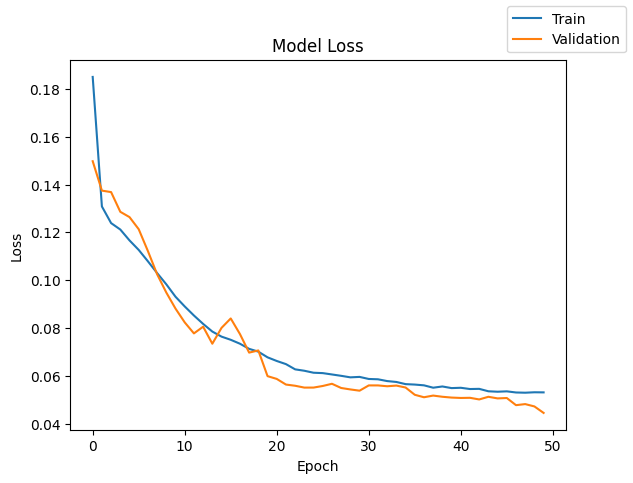

In [212]:
plot(history17,'loss')



$$
\boxed{
\begin{aligned}
&\text{1. The gap between training and validation loss at convergence remains minimal.} \\
\end{aligned}
}
$$


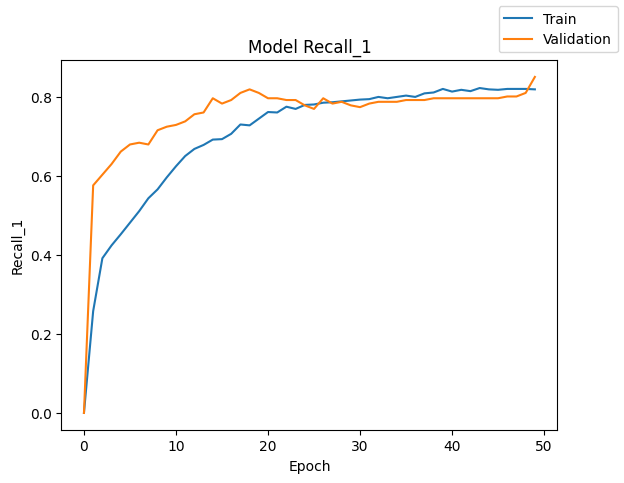

In [217]:
plot(history17,'recall_1')


$$
\boxed{
\begin{aligned}
&\text{1. Both training and validation recall converge quickly, with slight fluctuations towards the end.} \\
\end{aligned}
}
$$

In [219]:
results.loc[len(results)] = [
    2,  # Number of hidden layers
    [16, 8],  # Neurons in hidden layer
    ["ReLU", "ReLU"],  # Activation function
    epochs,  # Epochs
    16,  # Batch size
    "SGD",  # Optimizer
    [0.01, 0.9],  # Learning rate, momentum
    "He Normal",  # Weight initializer
    "-",  # Regularization
    history17.history['loss'][-1],
    history17.history['val_loss'][-1],
    history17.history['recall_1'][-1],  
    history17.history['val_recall_1'][-1], 
    round(end-start,2)  
]

In [220]:
results

,# hidden layers,# neurons - hidden layer,activation function - hidden layer,# epochs,batch size,optimizer,"learning rate, momentum",weight initializer,regularization,train loss,validation loss,train recall,validation recall,time (secs)
0,1,16,ReLU,50,32,SGD,"[0.01, -]",-,-,0.111683,0.113590,0.448198,0.518018,68.25
1,1,16,ReLU,50,32,SGD,"[0.01, 0.9]",-,-,0.074216,0.077015,0.700450,0.689189,58.96
2,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,-,0.057651,0.054069,0.784910,0.797297,65.61
3,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,Dropout (0.3),0.093040,0.060558,0.592342,0.761261,62.01
4,2,"[16, 8]","[ReLU, ReLU]",50,32,ADAM,[0.01],-,-,0.064352,0.073845,0.773649,0.648649,61.71
5,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,Dropout (0.1),0.074650,0.061987,0.713964,0.783784,64.10
6,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,-,0.057733,0.051328,0.790541,0.828829,60.23
7,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.001, 0.9]",Glorot Normal,-,0.104680,0.106638,0.530405,0.608108,60.71
8,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,Dropout (0.1),0.074488,0.059844,0.702703,0.707207,64.15
9,2,"[32, 16]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,-,0.054479,0.054764,0.805180,0.788288,61.48


$$
\boxed{
\begin{aligned}
&\text{1. The current model reduces the number of hidden layers from 3 to 2 ([32, 16, 8] → [16, 8]) and switches the weight initialization from Glorot Uniform to He Normal, while retaining other parameters.} \\
&\text{2. The validation recall improves slightly compared to the previous best model (model 16), indicating better generalization with the simpler architecture and He Normal initialization.} \\
&\text{3. The training recall is lower than the previous best model, suggesting that the simpler model learns less aggressively but generalizes better.} \\
&\text{4. Both training and validation loss are slightly higher in the current model compared to the previous best model, but the differences are minimal.} \\
&\text{} \\
&\text{Conclusion: Simplifying the architecture and using He Normal initialization results in a slight improvement in validation recall, making this model marginally superior to the previous best model.}
\end{aligned}
}
$$

### 🚀 **Model 18 : HE UNIFORM WEIGHT INITIALIZATION IN MODEL 11**

In [243]:
# clears the current Keras session, resetting all layers and models previously created, freeing up memory and resources.
tf.keras.backend.clear_session()

In [245]:
model_18 = Sequential([
    Dense(16, activation='relu', input_shape=(X_train.shape[1],), kernel_initializer=he_uniform()),  # Hidden layer with 16 neurons
    Dense(8, activation='relu'),  # Second hidden layer with 8 neurons
    Dense(1, activation='sigmoid')  # Output layer with sigmoid activation for binary classification
])

model_18.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9), 
                loss='binary_crossentropy', 
                metrics=['accuracy', Recall()])  # Include accuracy and recall

In [246]:
start = time.time()
history18 = model_18.fit(X_train_scaled, y_train, validation_data=(X_val_scaled,y_val) , batch_size=16, epochs=epochs)
end=time.time()

Epoch 1/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9120 - loss: 0.2305 - recall: 0.0400 - val_accuracy: 0.9592 - val_loss: 0.1450 - val_recall: 0.5631
Epoch 2/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9590 - loss: 0.1330 - recall: 0.3481 - val_accuracy: 0.9590 - val_loss: 0.1290 - val_recall: 0.6532
Epoch 3/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9623 - loss: 0.1198 - recall: 0.4248 - val_accuracy: 0.9655 - val_loss: 0.1165 - val_recall: 0.6667
Epoch 4/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9639 - loss: 0.1131 - recall: 0.4572 - val_accuracy: 0.9672 - val_loss: 0.1108 - val_recall: 0.6892
Epoch 5/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9677 - loss: 0.1056 - recall: 0.5051 - val_accuracy: 0.9695 - val_loss: 0.1052 - val_recall: 0.7027
Epoch 6/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9719 - loss: 0.0975 - recall: 0.5689 - val_accuracy: 0.9710 - val_loss: 0.0964 - val_recall:

In [247]:
print("Time taken in seconds ",end-start)

Time taken in seconds  71.2267017364502


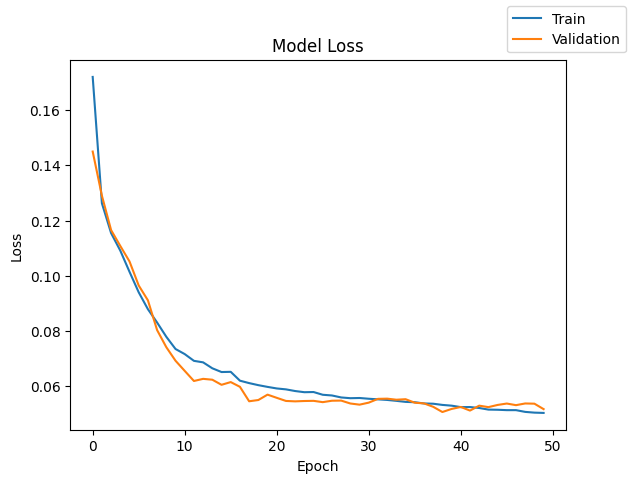

In [248]:
plot(history18,'loss')



$$
\boxed{
\begin{aligned}
&\text{1. The gap between the training and validation loss remains small, suggesting good generalization.} \\
\end{aligned}
}
$$



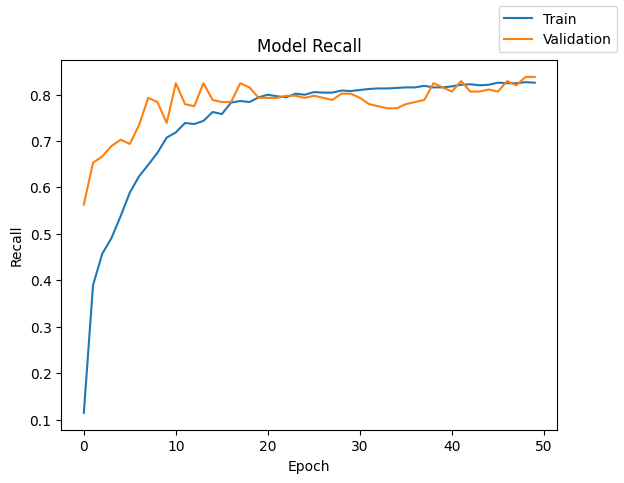

In [249]:
plot(history18,'recall')

$$
\boxed{
\begin{aligned}
&\text{1. There is a slight lag in the validation recall curve compared to the training recall.} \\
\end{aligned}
}
$$

In [250]:
results.loc[len(results)] = [
    2,  # Number of hidden layers
    [16, 8],  # Neurons in hidden layer
    ["ReLU", "ReLU"],  # Activation function
    epochs,  # Epochs
    16,  # Batch size
    "SGD",  # Optimizer
    [0.01, 0.9],  # Learning rate, momentum
    "He Uniform",  # Weight initializer
    "-",  # Regularization
    history18.history['loss'][-1],
    history18.history['val_loss'][-1],
    history18.history['recall'][-1],  
    history18.history['val_recall'][-1], 
    round(end-start,2)
]

In [251]:
results

,# hidden layers,# neurons - hidden layer,activation function - hidden layer,# epochs,batch size,optimizer,"learning rate, momentum",weight initializer,regularization,train loss,validation loss,train recall,validation recall,time (secs)
0,1,16,ReLU,50,32,SGD,"[0.01, -]",-,-,0.111683,0.113590,0.448198,0.518018,68.25
1,1,16,ReLU,50,32,SGD,"[0.01, 0.9]",-,-,0.074216,0.077015,0.700450,0.689189,58.96
2,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,-,0.057651,0.054069,0.784910,0.797297,65.61
3,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,Dropout (0.3),0.093040,0.060558,0.592342,0.761261,62.01
4,2,"[16, 8]","[ReLU, ReLU]",50,32,ADAM,[0.01],-,-,0.064352,0.073845,0.773649,0.648649,61.71
5,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,Dropout (0.1),0.074650,0.061987,0.713964,0.783784,64.10
6,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,-,0.057733,0.051328,0.790541,0.828829,60.23
7,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.001, 0.9]",Glorot Normal,-,0.104680,0.106638,0.530405,0.608108,60.71
8,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,Dropout (0.1),0.074488,0.059844,0.702703,0.707207,64.15
9,2,"[32, 16]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,-,0.054479,0.054764,0.805180,0.788288,61.48


$$
\boxed{
\begin{aligned}
&\text{1. The current model switches the weight initialization from He Normal to He Uniform, while retaining the same architecture and other parameters as the previous best model (model 17).} \\
&\text{2. The validation recall decreases slightly compared to the previous best model, indicating a minor drop in generalization performance.} \\
&\text{3. The training recall is slightly higher than the previous best model, suggesting that He Uniform helps the model learn more effectively during training.} \\
&\text{4. Both training and validation loss are slightly higher in the current model compared to the previous best model, reflecting reduced performance.} \\
&\text{} \\
&\text{Conclusion: Switching to He Uniform initialization results in faster training time but leads to a slight decrease in validation recall, making this model less optimal than the previous best model.}
\end{aligned}
}
$$

### 🚀 **Model 19 : INCREASING NEURONS IN MODEL 18**

In [255]:
# clears the current Keras session, resetting all layers and models previously created, freeing up memory and resources.
tf.keras.backend.clear_session()

In [256]:
model_19 = Sequential([
    Dense(32, activation='relu', input_shape=(X_train.shape[1],), kernel_initializer=he_uniform()),  # Hidden layer with 16 neurons
    Dense(16, activation='relu'),  # Second hidden layer with 8 neurons
    Dense(1, activation='sigmoid')  # Output layer with sigmoid activation for binary classification
])

model_19.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9), 
                loss='binary_crossentropy', 
                metrics=['accuracy', Recall()])  # Include accuracy and recall

In [257]:
start = time.time()
history19 = model_19.fit(X_train_scaled, y_train, validation_data=(X_val_scaled,y_val) , batch_size=16, epochs=epochs)
end=time.time()

Epoch 1/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9412 - loss: 0.2000 - recall: 0.0437 - val_accuracy: 0.9613 - val_loss: 0.1401 - val_recall: 0.5901
Epoch 2/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9604 - loss: 0.1298 - recall: 0.3733 - val_accuracy: 0.9610 - val_loss: 0.1295 - val_recall: 0.6261
Epoch 3/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9622 - loss: 0.1224 - recall: 0.4229 - val_accuracy: 0.9657 - val_loss: 0.1141 - val_recall: 0.6081
Epoch 4/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9642 - loss: 0.1143 - recall: 0.4613 - val_accuracy: 0.9668 - val_loss: 0.1091 - val_recall: 0.6216
Epoch 5/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9659 - loss: 0.1096 - recall: 0.4921 - val_accuracy: 0.9715 - val_loss: 0.1005 - val_recall: 0.6532
Epoch 6/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9696 - loss: 0.1020 - recall: 0.5269 - val_accuracy: 0.9745 - val_loss: 0.0921 - val_recall:

In [258]:
print("Time taken in seconds ",end-start)

Time taken in seconds  111.12707114219666


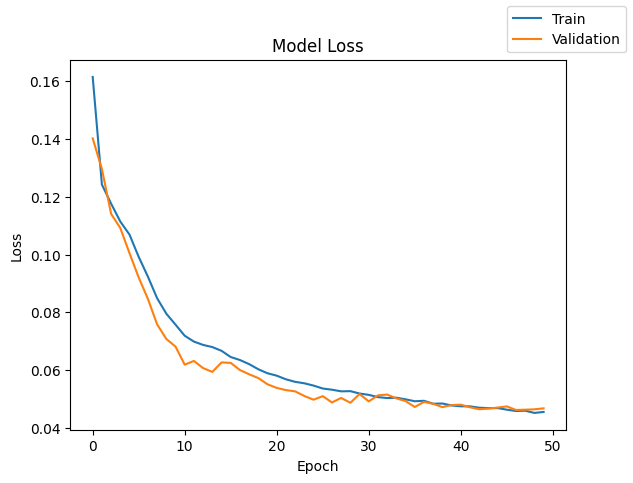

In [259]:
plot(history19,'loss')


$$
\boxed{
\begin{aligned}
&\text{1. The gap between the training and validation losses is minimal towards the end, indicating good model generalization.} \\
\end{aligned}
}
$$


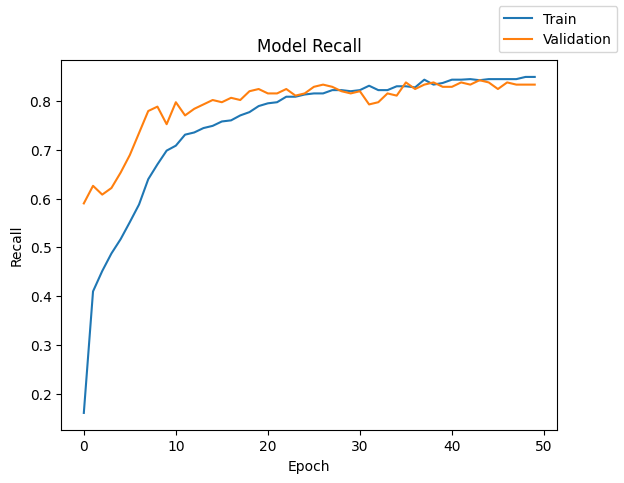

In [260]:
plot(history19,'recall')

$$
\boxed{
\begin{aligned}
&\text{1. The recall curves for both training and validation stay relatively close, with only small fluctuations.} \\
\end{aligned}
}
$$

In [261]:
results.loc[len(results)] = [
    2,  # Number of hidden layers
    [32, 16],  # Neurons in hidden layer
    ["ReLU", "ReLU"],  # Activation function
    epochs,  # Epochs
    16,  # Batch size
    "SGD",  # Optimizer
    [0.01, 0.9],  # Learning rate, momentum
    "He Uniform",  # Weight initializer
    "-",  # Regularization
    history19.history['loss'][-1],
    history19.history['val_loss'][-1],
    history19.history['recall'][-1],  
    history19.history['val_recall'][-1], 
    round(end-start,2)
]

In [262]:
results

,# hidden layers,# neurons - hidden layer,activation function - hidden layer,# epochs,batch size,optimizer,"learning rate, momentum",weight initializer,regularization,train loss,validation loss,train recall,validation recall,time (secs)
0,1,16,ReLU,50,32,SGD,"[0.01, -]",-,-,0.111683,0.113590,0.448198,0.518018,68.25
1,1,16,ReLU,50,32,SGD,"[0.01, 0.9]",-,-,0.074216,0.077015,0.700450,0.689189,58.96
2,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,-,0.057651,0.054069,0.784910,0.797297,65.61
3,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,Dropout (0.3),0.093040,0.060558,0.592342,0.761261,62.01
4,2,"[16, 8]","[ReLU, ReLU]",50,32,ADAM,[0.01],-,-,0.064352,0.073845,0.773649,0.648649,61.71
5,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,Dropout (0.1),0.074650,0.061987,0.713964,0.783784,64.10
6,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,-,0.057733,0.051328,0.790541,0.828829,60.23
7,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.001, 0.9]",Glorot Normal,-,0.104680,0.106638,0.530405,0.608108,60.71
8,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,Dropout (0.1),0.074488,0.059844,0.702703,0.707207,64.15
9,2,"[32, 16]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,-,0.054479,0.054764,0.805180,0.788288,61.48


$$
\boxed{
\begin{aligned}
&\text{1. The current model increases the number of neurons in the hidden layers from [16, 8] to [32, 16] and switches the weight initialization from He Normal to He Uniform, while retaining other parameters.} \\
&\text{2. The validation recall decreases slightly compared to the previous best model (model 17), indicating a minor drop in generalization performance.} \\
&\text{3. The training recall is higher than the previous best model, suggesting that the larger architecture and He Uniform initialization help the model learn more effectively during training.} \\
&\text{4. Both training and validation loss are slightly higher in the current model compared to the previous best model, reflecting reduced performance.} \\
&\text{} \\
&\text{Conclusion: While the current model learns better during training, the slight decrease in validation recall makes it less optimal than the previous best model with He Normal initialization.}
\end{aligned}
}
$$

### 🚀 **Model 20 : ADDING 1 MORE HIDDEN LAYER IN MODEL 18**

In [263]:
# clears the current Keras session, resetting all layers and models previously created, freeing up memory and resources.
tf.keras.backend.clear_session()

In [264]:
model_20 = Sequential([
    Dense(16, activation='relu', input_shape=(X_train.shape[1],), kernel_initializer=he_uniform()),  # Hidden layer with 16 neurons
    Dense(8, activation='relu'),  # Second hidden layer with 8 neurons
    Dense(4, activation='relu'),  # Third hidden layer with 4 neurons
    Dense(1, activation='sigmoid')  # Output layer with sigmoid activation for binary classification
])

model_20.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9), 
                loss='binary_crossentropy', 
                metrics=['accuracy', Recall()])  # Include accuracy and recall

In [265]:
start = time.time()
history20 = model_20.fit(X_train_scaled, y_train, validation_data=(X_val_scaled,y_val) , batch_size=16, epochs=epochs)
end=time.time()

Epoch 1/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9362 - loss: 0.2008 - recall: 0.0161 - val_accuracy: 0.9610 - val_loss: 0.1422 - val_recall: 0.6036
Epoch 2/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9593 - loss: 0.1315 - recall: 0.3601 - val_accuracy: 0.9668 - val_loss: 0.1165 - val_recall: 0.5856
Epoch 3/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9634 - loss: 0.1203 - recall: 0.4426 - val_accuracy: 0.9682 - val_loss: 0.1109 - val_recall: 0.6396
Epoch 4/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9660 - loss: 0.1122 - recall: 0.4926 - val_accuracy: 0.9743 - val_loss: 0.0959 - val_recall: 0.6757
Epoch 5/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9702 - loss: 0.1024 - recall: 0.5440 - val_accuracy: 0.9775 - val_loss: 0.0839 - val_recall: 0.6441
Epoch 6/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9722 - loss: 0.0960 - recall: 0.5928 - val_accuracy: 0.9833 - val_loss: 0.0753 - val_recall:

In [266]:
print("Time taken in seconds ",end-start)

Time taken in seconds  115.40819978713989


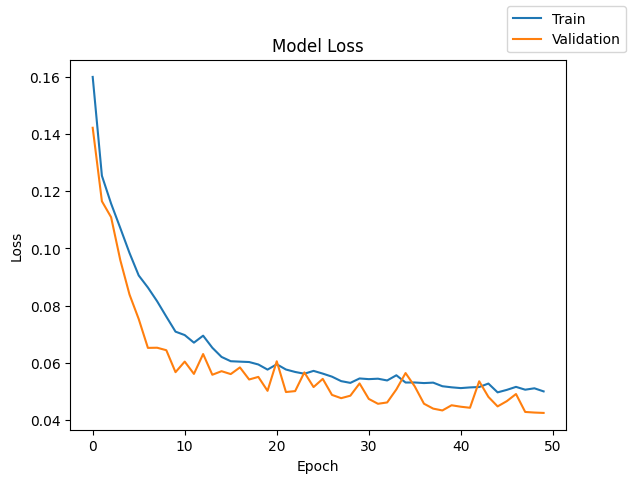

In [268]:
plot(history20,'loss')


$$
\boxed{
\begin{aligned}
&\text{1. The validation loss stays lower than the training loss, but the gap remains small.} \\
\end{aligned}
}
$$


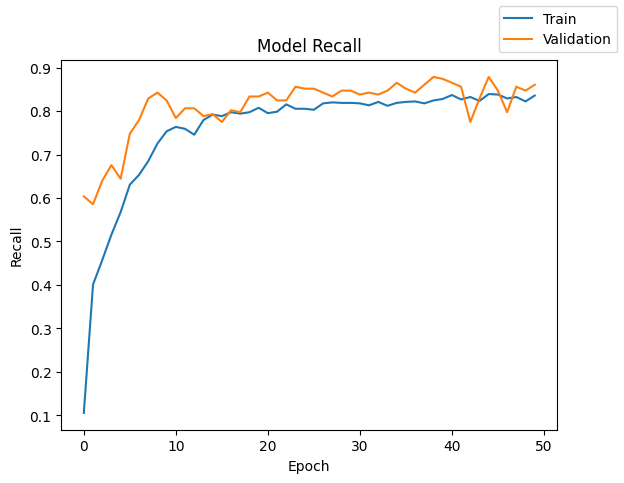

In [269]:
plot(history20,'recall')


$$
\boxed{
\begin{aligned}
&\text{1. Validation recall curves fluctuates at the final epochs, but stays above train recall curve at the end.} \\
\end{aligned}
}
$$

In [270]:
results.loc[len(results)] = [
    3,  # Number of hidden layers
    [16, 8, 4],  # Neurons in hidden layer
    ["ReLU", "ReLU", "ReLU"],  # Activation function
    epochs,  # Epochs
    16,  # Batch size
    "SGD",  # Optimizer
    [0.01, 0.9],  # Learning rate, momentum
    "He Uniform",  # Weight initializer
    "-",  # Regularization
    history20.history['loss'][-1],
    history20.history['val_loss'][-1],
    history20.history['recall'][-1],  
    history20.history['val_recall'][-1], 
    round(end-start,2)
]

In [271]:
results

,# hidden layers,# neurons - hidden layer,activation function - hidden layer,# epochs,batch size,optimizer,"learning rate, momentum",weight initializer,regularization,train loss,validation loss,train recall,validation recall,time (secs)
0,1,16,ReLU,50,32,SGD,"[0.01, -]",-,-,0.111683,0.113590,0.448198,0.518018,68.25
1,1,16,ReLU,50,32,SGD,"[0.01, 0.9]",-,-,0.074216,0.077015,0.700450,0.689189,58.96
2,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,-,0.057651,0.054069,0.784910,0.797297,65.61
3,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,Dropout (0.3),0.093040,0.060558,0.592342,0.761261,62.01
4,2,"[16, 8]","[ReLU, ReLU]",50,32,ADAM,[0.01],-,-,0.064352,0.073845,0.773649,0.648649,61.71
5,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,Dropout (0.1),0.074650,0.061987,0.713964,0.783784,64.10
6,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,-,0.057733,0.051328,0.790541,0.828829,60.23
7,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.001, 0.9]",Glorot Normal,-,0.104680,0.106638,0.530405,0.608108,60.71
8,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,Dropout (0.1),0.074488,0.059844,0.702703,0.707207,64.15
9,2,"[32, 16]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,-,0.054479,0.054764,0.805180,0.788288,61.48


$$
\boxed{
\begin{aligned}
&\text{1. The current model increases the number of hidden layers from 2 to 3 ([16, 8] → [16, 8, 4]) and switches the weight initialization from He Normal to He Uniform, while retaining other parameters.} \\
&\text{2. The validation recall improves slightly compared to the previous best model (model 17), indicating better generalization with the deeper architecture and He Uniform initialization.} \\
&\text{3. The training recall is lower than the previous best model, suggesting that the deeper model learns less aggressively but generalizes better.} \\
&\text{4. Both training and validation loss are slightly lower in the current model compared to the previous best model, reflecting improved performance.} \\
&\text{} \\
&\text{Conclusion: While the current model shows superior or nearly equivalent performance in terms of validation recall and loss metrics, its increased complexity (additional hidden layer) makes it less favorable compared to the simpler previous best model. To maintain simplicity and efficiency, we will stay with the previous best model.}
\end{aligned}
}
$$

### 🚀 **Model 21 : INCREASING NEURONS AND ADDING DROPOUT IN MODEL 20** 

In [272]:
#  clears the current Keras session, resetting all layers and models previously created, freeing up memory and resources.
tf.keras.backend.clear_session()

In [273]:
model_21 = Sequential([
    Dense(32, activation='relu', input_shape=(X_train.shape[1],), kernel_initializer=he_uniform()),  # Hidden layer with 16 neurons
    Dropout(0.3),
    Dense(16, activation='relu'),  # Second hidden layer with 8 neurons
    Dropout(0.3),
    Dense(8, activation='relu'),  # Third hidden layer with 4 neurons
    Dropout(0.3),
    Dense(1, activation='sigmoid')  # Output layer with sigmoid activation for binary classification
])

model_21.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9), 
                loss='binary_crossentropy', 
                metrics=['accuracy', Recall()])  # Include accuracy and recall

In [274]:
start = time.time()
history21 = model_21.fit(X_train_scaled, y_train, validation_data=(X_val_scaled,y_val) , batch_size=16, epochs=epochs)
end=time.time()

Epoch 1/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9307 - loss: 0.2681 - recall: 0.0000e+00 - val_accuracy: 0.9445 - val_loss: 0.1643 - val_recall: 0.0000e+00
Epoch 2/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.9459 - loss: 0.1725 - recall: 0.0279 - val_accuracy: 0.9505 - val_loss: 0.1333 - val_recall: 0.1081
Epoch 3/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9509 - loss: 0.1579 - recall: 0.1648 - val_accuracy: 0.9625 - val_loss: 0.1213 - val_recall: 0.5000
Epoch 4/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9522 - loss: 0.1536 - recall: 0.2241 - val_accuracy: 0.9650 - val_loss: 0.1167 - val_recall: 0.4414
Epoch 5/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9549 - loss: 0.1431 - recall: 0.2861 - val_accuracy: 0.9675 - val_loss: 0.1182 - val_recall: 0.6667
Epoch 6/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.9546 - loss: 0.1419 - recall: 0.2755 - val_accuracy: 0.9737 - val_loss: 0.1016 - val

In [277]:
print("Time taken in seconds ",end-start)

Time taken in seconds  154.04563069343567


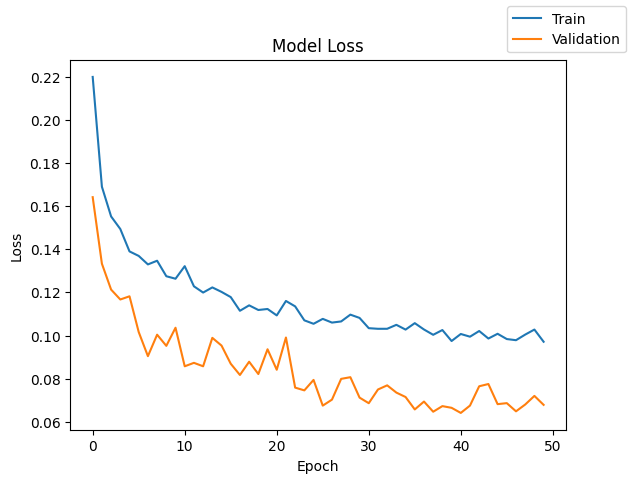

In [278]:
plot(history21,'loss')



$$
\boxed{
\begin{aligned}
&\text{1. The training loss is higher than the validation loss, which could suggest underfitting.} \\
&\text{2. The model might be too simple or insufficiently trained, struggling to capture the patterns in the training data.} \\
&\text{3. Regularization techniques might be preventing the model from fitting too closely to the training data, resulting in a higher training loss while the validation loss remains lower.} \\
&\text{4. The validation loss is lower, indicating that the model might be generalizing better, but it's not fully capturing the complexity of the training set.} \\
\end{aligned}
}
$$

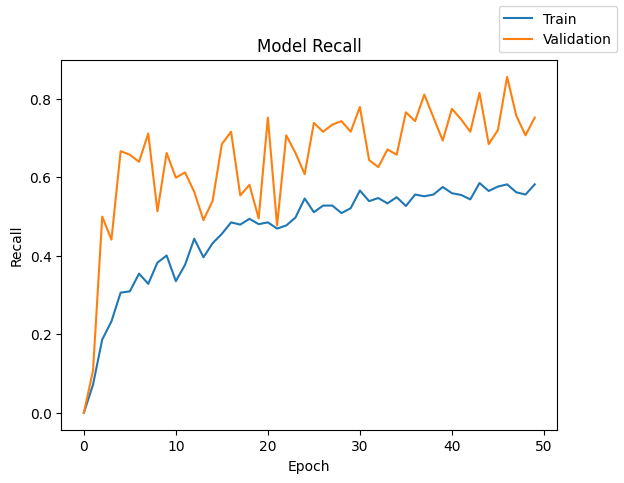

In [279]:
plot(history21,'recall')

$$
\boxed{
\begin{aligned}
&\text{1. The recall for the training set increases steadily, but the validation recall shows more fluctuations.} \\
&\text{2. Validation recall starts higher and fluctuates, while the training recall shows smoother progress. This could indicate underfitting in the model.} \\
&\text{3. The model seems to perform better on the validation set, which might be a result of regularization} \\
&\text{4. The larger fluctuations in the validation recall curve suggest that the model may need further adjustments to improve consistency.} \\
\end{aligned}
}
$$

In [280]:
results.loc[len(results)] = [
    3,  # Number of hidden layers
    [32, 16, 8],  # Neurons in hidden layer
    ["ReLU", "ReLU", "ReLU"],  # Activation function
    epochs,  # Epochs
    16,  # Batch size
    "SGD",  # Optimizer
    [0.01, 0.9],  # Learning rate, momentum
    "He Uniform",  # Weight initializer
    "Dropout (0.3)",  # Regularization
    history21.history['loss'][-1],
    history21.history['val_loss'][-1],
    history21.history['recall'][-1],  
    history21.history['val_recall'][-1], 
    round(end-start,2)
]

In [281]:
results

,# hidden layers,# neurons - hidden layer,activation function - hidden layer,# epochs,batch size,optimizer,"learning rate, momentum",weight initializer,regularization,train loss,validation loss,train recall,validation recall,time (secs)
0,1,16,ReLU,50,32,SGD,"[0.01, -]",-,-,0.111683,0.113590,0.448198,0.518018,68.25
1,1,16,ReLU,50,32,SGD,"[0.01, 0.9]",-,-,0.074216,0.077015,0.700450,0.689189,58.96
2,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,-,0.057651,0.054069,0.784910,0.797297,65.61
3,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,Dropout (0.3),0.093040,0.060558,0.592342,0.761261,62.01
4,2,"[16, 8]","[ReLU, ReLU]",50,32,ADAM,[0.01],-,-,0.064352,0.073845,0.773649,0.648649,61.71
5,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",-,Dropout (0.1),0.074650,0.061987,0.713964,0.783784,64.10
6,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,-,0.057733,0.051328,0.790541,0.828829,60.23
7,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.001, 0.9]",Glorot Normal,-,0.104680,0.106638,0.530405,0.608108,60.71
8,2,"[16, 8]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,Dropout (0.1),0.074488,0.059844,0.702703,0.707207,64.15
9,2,"[32, 16]","[ReLU, ReLU]",50,32,SGD,"[0.01, 0.9]",Glorot Normal,-,0.054479,0.054764,0.805180,0.788288,61.48


$$
\boxed{
\begin{aligned}
&\text{1. The current model increases the number of neurons in the hidden layers from [16, 8, 4] to [32, 16, 8] and introduces Dropout (0.3) regularization, while retaining He Uniform initialization and other parameters.} \\
&\text{2. The validation recall decreases significantly compared to the previous best model (model 17), indicating that the added complexity and Dropout negatively impact generalization.} \\
&\text{3. The training recall is much lower than the previous best model, suggesting that Dropout (0.3) overly regularizes the model, limiting its ability to learn effectively.} \\
&\text{4. Both training and validation loss are higher in the current model compared to the previous best model, reflecting poorer performance.} \\
&\text{} \\
&\text{Conclusion: The addition of Dropout (0.3) and increased model complexity lead to a significant drop in both recall and loss metrics, making this model inferior to the previous best model.}
\end{aligned}
}
$$

-----
## 🌟 **Final Model Selection** 🌟
-----

Finalizing **Model 17** as the final model because it achieves a high validation recall (**0.8514**) while maintaining efficiency with a training time of **111.51 seconds**. This model strikes an excellent balance between performance, simplicity, and computational cost.

#### **Key Reasons for Finalizing Model 17:**
1. **High Recall**: The validation recall of **0.8514** is very close to the best-performing model (**Model 12**, 0.8739), making it highly effective for detecting failures.
2. **Compatibility with ReLU**: We chose **He Normal initialization** because it is specifically designed for ReLU activation functions, ensuring better weight scaling and faster convergence compared to **He Uniform**.
   - **Comparison**: 
     - **He Normal (Model 17)**: Achieves a recall of **0.8514** with a validation loss of **0.0444**.
     - **He Uniform (Model 18)**: Achieves a recall of **0.8378** with a validation loss of **0.0516**.
     - He Normal outperforms He Uniform in both recall and loss metrics, demonstrating its superiority for ReLU-based architectures.
3. **Efficiency**: With a training time of **111.51 seconds**, **Model 17** is significantly faster than the 100-epoch model (**Model 13**, 219.43 seconds) while achieving comparable results.
4. **Simplicity**: The model uses a simple architecture with **2 hidden layers** ([16, 8]), ensuring ease of deployment and maintenance.

#### **Why Not the Model 13 with 100 epochs?**
While increasing epochs to 100 (**Model 13**) improves recall slightly (**0.8739**), the additional training time (**219.43 seconds**) is not justified given that similar performance can be achieved with a simpler model. The results from **Model 17** demonstrate that a 50-epoch training regime is sufficient to achieve robust performance without unnecessary computational overhead.

---

#### **Conclusion**
$$
\boxed{\text{Final Model: Model 17}}
$$

This model provides the best trade-off between **recall**, **training time**, and **simplicity**, making it the ideal choice for deployment.

In [309]:
# generate predictions (probabilities) for X_test
y_test_pred_prob = model_17.predict(X_test_scaled)

# Convert probabilities to binary predictions (0 or 1)
y_test_pred = (y_test_pred_prob > 0.5).astype("int32")

157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step


In [310]:
# Calculate recall
test_recall = recall_score(y_test, y_test_pred)
print(f"Test Recall: {test_recall:.4f}")

Test Recall: 0.8262


In [311]:
# Calculate accuracy
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f"Test Accuracy: {test_accuracy:.4f}")

Test Accuracy: 0.9898


In [ ]:
# Calculate precision
test_precision = precision_score(y_test, y_test_pred)
print(f"Test Precision: {test_precision:.4f}")

Test Precision: 0.9915


In [ ]:
# Calculate f1 score
test_f1 = f1_score(y_test, y_test_pred)
print(f"Test F1-Score: {test_f1:.4f}")

Test F1-Score: 0.9014


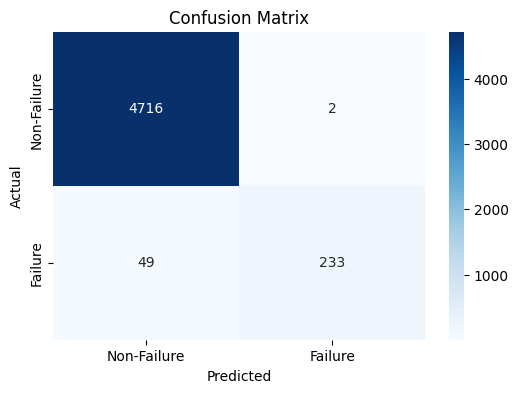

In [319]:
# Generate confusion matrix
cm = confusion_matrix(y_test, y_test_pred)

# Plot confusion matrix
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Non-Failure", "Failure"], yticklabels=["Non-Failure", "Failure"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

In [315]:
# Save the model to a file
save_model(model_17, "model_17.keras")

-----
## 🌟 **Actionable Insights & Recommendations** 🌟
-----

### **Actionable Insights & Recommendations**

1. **Feature Importance for Predictive Modeling**:
   - Insights: Features such as "V3", "V7", "V11", "V15", "V16", "V18", "V21", "V28", "V36", and "V39" were found to have significant correlations (absolute value > 0.20) with the target variable.
   - Recommendation: Prioritize these features during data preprocessing and model training. Consider removing or reducing the weight of less relevant features to simplify the model and improve computational efficiency.

2. **Addressing Class Imbalance**:
   - Insights: The target variable exhibits a highly imbalanced distribution (94.5% class 0 vs. 5.5% class 1), which may impact the model's ability to predict minority class instances accurately.
   - Recommendation: Implement techniques such as oversampling (e.g., SMOTE), undersampling, or using class-weighted loss functions during training to improve the model's performance on the minority class.

3. **Model Complexity vs. Performance Trade-Off**:
   - Insights: Simpler models with fewer layers and neurons (e.g., Model 17 with 2 hidden layers [16, 8]) achieved high validation recall.
   - Recommendation: Opt for simpler architectures when deploying models to production to ensure faster inference times and lower computational costs without sacrificing performance.

4. **Optimal Hyperparameter Configuration**:
   - Insights: Models trained with SGD optimizer, momentum (0.9), and He Normal/He Uniform initialization consistently outperformed others in terms of recall and generalization.
   - Recommendation: Standardize the use of SGD with momentum and He-based weight initialization for future experiments to achieve consistent and reliable results.

5. **Balancing Training Time and Epochs**:
   - Insights: Increasing the number of epochs from 50 to 100 improved recall slightly but significantly increased training time.
   - Recommendation: For real-time applications, limit the number of epochs to 50 to maintain efficiency.

6. **Dimensionality Reduction**:
   - Insights: Many features were highly correlated, suggesting redundancy in the dataset.
   - Recommendation: Apply dimensionality reduction techniques like PCA to reduce feature space and improve model interpretability without losing predictive power.

7. **Deployment Readiness**:
   - Insights: Model 17 (2 hidden layers, [16, 8], He Uniform initialization, 50 epochs) strikes an optimal balance between recall, training time, and simplicity.
   - Recommendation: Deploy Model 17 as the final solution for predicting failures. Continuously monitor its performance in production and retrain periodically with updated data to maintain accuracy.

8. **Monitoring Outliers**:
   - Insights: All independent variables exhibited outliers, though their distributions were approximately symmetric.
   - Recommendation: Regularly monitor and handle outliers in the input data pipeline to prevent unexpected model behavior in production.

---

### **Conclusion**
The key takeaway is that simplicity, efficiency, and robustness should guide the deployment of the predictive model. By focusing on the most impactful features, addressing class imbalance, and leveraging optimal hyperparameters, the business can achieve reliable predictions while minimizing computational overhead. Continuous monitoring and iterative improvements will ensure the model remains effective in dynamic real-world scenarios.